In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
#sc.logging.print_header()
sc.settings.set_figure_params(dpi=100, facecolor='white')

In [3]:
#from igraph import *
#from MulticoreTSNE import MulticoreTSNE as TSNE #faster TSNE alternative
#from anndata import read_h5ad
#from anndata import read_csv
from matplotlib import rcParams
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
from scipy.stats import entropy
from math import log, e

In [5]:
results_file = 'C:/Users/sruth/Box/Pitt/Tabula Muris senis- for proposal/processed h5ad files-figshare/tabula-muris-senis-facs-processed-official-annotations-Limb_Muscle.h5ad'  # the file that will store the analysis results
adata = sc.read_h5ad(results_file)

C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\anndata\compat\__init__.py:182: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  FutureWarning,
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\anndata\compat\__init__.py:182: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  FutureWarning,


In [6]:
# TMS bulk data limb muscle

file = "TMS_bulk_limbmuscle_raw_counts.csv" # the file that will store the analysis results
tms_bulk_df= pd.read_csv(file,index_col=0)
tms_bulk_df_t = tms_bulk_df.T

In [28]:
# TMS single FACS data 
# male and female mixed
# eliminated genes - which did not satisfy: minimum 10 non zero cells

file = "nonzero_10cutoff_facscountmatrix8dec.csv" # the file that will store the analysis results
adata_facs_df= pd.read_csv(file,index_col=0)

In [29]:
alltfdf=pd.read_csv("C:/Users/sruth/Box/Pitt/Tabula Muris senis- for proposal/Noisy channel-TMS research/trrust_rawdata.mouse_wheader.csv")

In [9]:
tms_bulk_df_t.head()

gene,0610005C13Rik,0610006L08Rik,0610009B22Rik,0610009E02Rik,0610009L18Rik,0610010F05Rik,0610010K14Rik,0610012D04Rik,0610012G03Rik,0610025J13Rik,...,n-R5s90,n-R5s92,n-R5s93,n-R5s94,n-R5s95,n-R5s96,n-R5s97,n-R5s98,n-TSaga9,n-TStga1
1_age_1_sex_m,9,1,111,9,126,225,9,2,620,1,...,0,0,0,0,0,0,1,0,0,0
2_age_1_sex_f,2,0,151,5,164,197,27,3,711,0,...,3,0,0,0,0,0,0,0,0,0
3_age_1_sex_m,3,0,237,8,206,536,33,0,980,7,...,1,0,0,0,1,0,0,0,0,0
4_age_1_sex_m,4,0,113,3,135,176,20,6,586,0,...,0,0,0,0,0,0,0,0,0,0
5_age_1_sex_f,0,0,122,3,89,176,14,3,556,1,...,0,0,0,0,0,0,0,0,0,0


In [30]:
adata_facs_df.shape
adata_facs_df

,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610009B22Rik,0610009D07Rik,0610009L18Rik,0610009O20Rik,...,Zufsp,Zw10,Zwint,Zxdc,Zyg11b,Zyx,Zzef1,Zzz3,age,celltype
18m,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.334001,0.037076,0.0,0.000000,...,0.000000,0.0,0.000000,0.000000,0.04276,0.000000,0.000000,0.153797,18m,skeletal muscle satellite cell
18m,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,2.299186,0.0,0.000000,...,0.000000,0.0,0.000000,6.599676,0.00000,2.941003,0.000000,0.000000,18m,skeletal muscle satellite cell
18m,0.000000,0.072408,0.0,0.000000,0.000000,0.0,0.000000,2.137391,0.0,0.000000,...,0.000000,0.0,0.038261,0.046321,0.00000,2.052351,0.000000,0.000000,18m,skeletal muscle satellite cell
18m,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.000000,0.00000,0.140650,0.000000,0.000000,18m,skeletal muscle satellite cell
18m,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.000000,0.00000,0.599470,0.053462,0.000000,18m,skeletal muscle satellite cell
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3m,0.044685,0.000000,0.0,0.000000,4.582806,0.0,0.000000,1.013428,0.0,0.000000,...,0.000000,0.0,0.270388,0.000000,0.00000,2.147696,0.000000,0.000000,3m,B cell
3m,0.000000,0.000000,0.0,0.000000,0.189712,0.0,0.000000,1.735361,0.0,0.000000,...,0.000000,0.0,0.000000,0.000000,0.00000,0.715499,0.042486,0.000000,3m,macrophage
3m,0.000000,0.070351,0.0,0.000000,0.000000,0.0,0.000000,0.578650,0.0,0.000000,...,0.000000,0.0,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,3m,T cell
3m,0.000000,1.093036,0.0,10.000000,0.000000,0.0,0.000000,2.482042,0.0,0.000000,...,0.942498,0.0,0.000000,0.000000,0.00000,0.000000,5.873034,0.000000,3m,B cell


In [31]:
adata_facs_df['age'].value_counts()

18m    1521
24m    1232
3m     1102
Name: age, dtype: int64

In [32]:
adata.obs['age'].value_counts()

18m    1521
24m    1232
3m     1102
Name: age, dtype: int64

In [13]:
adata.obs

,FACS.selection,age,cell,cell_ontology_class,cell_ontology_id,free_annotation,method,mouse.id,sex,subtissue,tissue,n_genes,n_counts,louvain,leiden
index,,,,,,,,,,,,,,,
A10_B000927_B007456_S10.mm10-plus-0-0,"CD31+, CD45+, CD31-CD45-Sca1+, CD31-CD45-Sca1-...",18m,A10_B000927,skeletal muscle satellite cell,nan,nan,facs,18_46_F,female,Muscle Diaphragm,Limb_Muscle,2789,878950.0,1,3
A10_B003294_B007450_S10.mm10-plus-0-0,"CD31+, CD45+, CD31-CD45-Sca1+, CD31-CD45-Sca1-...",18m,A10_B003294,skeletal muscle satellite cell,nan,nan,facs,18_47_F,female,Muscle forelimb and hindlimb,Limb_Muscle,1838,1775407.0,0,2
A11_B000927_B007456_S11.mm10-plus-0-0,"CD31+, CD45+, CD31-CD45-Sca1+, CD31-CD45-Sca1-...",18m,A11_B000927,skeletal muscle satellite cell,nan,nan,facs,18_46_F,female,Muscle Diaphragm,Limb_Muscle,3198,1523418.0,7,9
A11_B003263_B007458_S11.mm10-plus-0-0,"CD31+, CD45+, CD31-CD45-Sca1+, CD31-CD45-Sca1-...",18m,A11_B003263,skeletal muscle satellite cell,nan,nan,facs,18_45_M,male,forelimb and hindlimb,Limb_Muscle,1082,1037959.0,1,3
A11_B003294_B007450_S11.mm10-plus-0-0,"CD31+, CD45+, CD31-CD45-Sca1+, CD31-CD45-Sca1-...",18m,A11_B003294,skeletal muscle satellite cell,nan,nan,facs,18_47_F,female,Muscle forelimb and hindlimb,Limb_Muscle,1218,1147542.0,8,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P8.D042473.3_10_M.1.1-1-1,nan,3m,P8.D042473.3_10_M.1.1,B cell,CL:0000236,nan,facs,3_10_M,male,ForelimbandHindlimb,Limb_Muscle,1712,270705.0,12,15
P9.B002765.3_38_F.1.1-1-1,nan,3m,P9.B002765.3_38_F.1.1,macrophage,CL:0000235,nan,facs,3_38_F,female,ForelimbandHindlimb,Limb_Muscle,2749,1446574.0,9,7
P9.B002769.3_39_F.1.1-1-1,nan,3m,P9.B002769.3_39_F.1.1,T cell,CL:0000084,nan,facs,3_39_F,female,ForelimbandHindlimb,Limb_Muscle,1560,261471.0,12,15


In [14]:
adata.obs['mouse.id'].unique()

['18_46_F', '18_47_F', '18_45_M', '18_53_M', '24_59_M', ..., '3_11_M', '3_8_M', '3_39_F', '3_10_M', '3_9_M']
Length: 14
Categories (14, object): ['18_46_F', '18_47_F', '18_45_M', '18_53_M', ..., '3_8_M', '3_39_F', '3_10_M', '3_9_M']

In [15]:
sc_facs=adata_facs_df

sc_facs.index=list(adata.obs.index.values)
#sc_facs.columns=list(adata.var.index.values)

sc_facs['age']=list(adata.obs.age)
sc_facs['animal_id']=list(adata.obs['mouse.id'])
sc_facs['celltype']=list(adata.obs.cell_ontology_class)
sc_facs['sex']=list(adata.obs.sex)

In [16]:
# age1m_df=adata_facs_df[adata_facs_df['age']=='1m']
# age3m_df=adata_facs_df[adata_facs_df['age']=='3m']
# age18m_df=adata_facs_df[adata_facs_df['age']=='18m']
# age21m_df=adata_facs_df[adata_facs_df['age']=='21m']
# age24m_df=adata_facs_df[adata_facs_df['age']=='24m']
# age30m_df=adata_facs_df[adata_facs_df['age']=='30m']

age1m_df=sc_facs[sc_facs['age']=='1m']
age3m_df=sc_facs[sc_facs['age']=='3m']
age18m_df=sc_facs[sc_facs['age']=='18m']
age21m_df=sc_facs[sc_facs['age']=='21m']
age24m_df=sc_facs[sc_facs['age']=='24m']
age30m_df=sc_facs[sc_facs['age']=='30m']

In [17]:
unique_dict={}
test_list=dict(zip(list(alltfdf['TF genes']),list(alltfdf['Non-TF genes'])))
for item in test_list.items():
    if item not in unique_dict:
        unique_dict.update({item})
    

len(unique_dict) 

827

In [18]:
age3m_df

,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610009B22Rik,0610009D07Rik,0610009L18Rik,0610009O20Rik,...,Zwint,Zxdc,Zyg11b,Zyx,Zzef1,Zzz3,age,celltype,animal_id,sex
A1.B002765.3_38_F.1.1-1-1,1.761104,1.541098,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,...,1.522642,0.0,0.000000,1.806709,0.000000,0.000000,3m,skeletal muscle satellite cell,3_38_F,female
A1.D042103.3_11_M.1-1-1,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,3m,skeletal muscle satellite cell,3_11_M,male
A1.D042186.3_8_M.1.1-1-1,0.000000,1.788955,0.0,0.000000,0.000000,0.0,0.000000,0.384158,0.0,0.000000,...,0.000000,0.0,0.161871,1.352870,1.701163,0.289918,3m,skeletal muscle satellite cell,3_8_M,male
A10.B002765.3_38_F.1.1-1-1,0.000000,3.050026,0.0,0.000000,0.000000,0.0,0.000000,1.533476,0.0,0.000000,...,0.025267,0.0,0.000000,0.000000,0.000000,0.000000,3m,skeletal muscle satellite cell,3_38_F,female
A10.B002769.3_39_F.1.1-1-1,1.564775,0.000000,0.0,0.000000,0.000000,0.0,2.696855,0.817633,0.0,1.073734,...,0.000000,0.0,0.029860,0.719527,0.024443,0.000000,3m,skeletal muscle satellite cell,3_39_F,female
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P8.D042473.3_10_M.1.1-1-1,0.044685,0.000000,0.0,0.000000,4.582806,0.0,0.000000,1.013428,0.0,0.000000,...,0.270388,0.0,0.000000,2.147696,0.000000,0.000000,3m,B cell,3_10_M,male
P9.B002765.3_38_F.1.1-1-1,0.000000,0.000000,0.0,0.000000,0.189712,0.0,0.000000,1.735361,0.0,0.000000,...,0.000000,0.0,0.000000,0.715499,0.042486,0.000000,3m,macrophage,3_38_F,female
P9.B002769.3_39_F.1.1-1-1,0.000000,0.070351,0.0,0.000000,0.000000,0.0,0.000000,0.578650,0.0,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,3m,T cell,3_39_F,female
P9.D042186.3_8_M.1.1-1-1,0.000000,1.093036,0.0,10.000000,0.000000,0.0,0.000000,2.482042,0.0,0.000000,...,0.000000,0.0,0.000000,0.000000,5.873034,0.000000,3m,B cell,3_8_M,male


# Finding entropy after summing expression of all cells (to compare to bulkRNAseq) Figure 1A and 1B

C:\Users\sruth\Box\Sruthi.RNA-seq\shannon_entropy_Tim_17jun

    Original location for sarcopenia bulk RNA seq data

In [59]:
from scipy.stats import entropy


In [60]:
age3m = age3m_df.drop(['age','celltype'], axis=1)
age3m_mean= age3m.mean(axis = 0, skipna = True)
age3m_mean_animal=age3m.groupby('animal_id').mean()
age3m= age3m.sum(axis = 0, skipna = True)


In [61]:
age18m = age18m_df.drop(['age','celltype'], axis=1)
age18m_mean= age18m_df.mean(axis = 0, skipna = True)
age18m_mean_animal=age18m.groupby('animal_id').mean()
age18m= age18m.sum(axis = 0, skipna = True)


In [62]:
age24m = age24m_df.drop(['age','celltype'], axis=1)
age24m_mean= age24m.mean(axis = 0, skipna = True)
age24m_mean_animal=age24m.groupby('animal_id').mean()
age24m= age24m.sum(axis = 0, skipna = True)


In [63]:
age24m_mean

0610007C21Rik    0.564742
0610007L01Rik    0.293902
0610007N19Rik    0.224080
0610007P08Rik    0.055116
0610007P14Rik    0.164437
                   ...   
Zxdc             0.173912
Zyg11b           0.115579
Zyx              0.581208
Zzef1            0.142874
Zzz3             0.145802
Length: 10835, dtype: float64

In [64]:
age3m_df

,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610009B22Rik,0610009D07Rik,0610009L18Rik,0610009O20Rik,...,Zwint,Zxdc,Zyg11b,Zyx,Zzef1,Zzz3,age,celltype,animal_id,sex
A1.B002765.3_38_F.1.1-1-1,1.761104,1.541098,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,...,1.522642,0.0,0.000000,1.806709,0.000000,0.000000,3m,skeletal muscle satellite cell,3_38_F,female
A1.D042103.3_11_M.1-1-1,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,3m,skeletal muscle satellite cell,3_11_M,male
A1.D042186.3_8_M.1.1-1-1,0.000000,1.788955,0.0,0.000000,0.000000,0.0,0.000000,0.384158,0.0,0.000000,...,0.000000,0.0,0.161871,1.352870,1.701163,0.289918,3m,skeletal muscle satellite cell,3_8_M,male
A10.B002765.3_38_F.1.1-1-1,0.000000,3.050026,0.0,0.000000,0.000000,0.0,0.000000,1.533476,0.0,0.000000,...,0.025267,0.0,0.000000,0.000000,0.000000,0.000000,3m,skeletal muscle satellite cell,3_38_F,female
A10.B002769.3_39_F.1.1-1-1,1.564775,0.000000,0.0,0.000000,0.000000,0.0,2.696855,0.817633,0.0,1.073734,...,0.000000,0.0,0.029860,0.719527,0.024443,0.000000,3m,skeletal muscle satellite cell,3_39_F,female
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P8.D042473.3_10_M.1.1-1-1,0.044685,0.000000,0.0,0.000000,4.582806,0.0,0.000000,1.013428,0.0,0.000000,...,0.270388,0.0,0.000000,2.147696,0.000000,0.000000,3m,B cell,3_10_M,male
P9.B002765.3_38_F.1.1-1-1,0.000000,0.000000,0.0,0.000000,0.189712,0.0,0.000000,1.735361,0.0,0.000000,...,0.000000,0.0,0.000000,0.715499,0.042486,0.000000,3m,macrophage,3_38_F,female
P9.B002769.3_39_F.1.1-1-1,0.000000,0.070351,0.0,0.000000,0.000000,0.0,0.000000,0.578650,0.0,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,3m,T cell,3_39_F,female
P9.D042186.3_8_M.1.1-1-1,0.000000,1.093036,0.0,10.000000,0.000000,0.0,0.000000,2.482042,0.0,0.000000,...,0.000000,0.0,0.000000,0.000000,5.873034,0.000000,3m,B cell,3_8_M,male


In [65]:
len(age3m_df)+len(age18m_df)+len(age24m_df)

3855

In [66]:
age3m_mean_animal

,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610009B22Rik,0610009D07Rik,0610009L18Rik,0610009O20Rik,...,Zswim6,Zswim7,Zufsp,Zw10,Zwint,Zxdc,Zyg11b,Zyx,Zzef1,Zzz3
animal_id,,,,,,,,,,,,,,,,,,,,,
3_10_M,0.656059,0.597111,0.330949,0.220857,0.312136,0.183908,0.166192,0.629353,0.051472,0.207039,...,0.460172,0.178902,0.304717,0.495759,0.337406,0.465180,0.222083,0.737133,0.404277,0.440618
3_11_M,0.638704,0.492194,0.442516,0.113218,0.164927,0.161550,0.266114,0.502351,0.001300,0.432754,...,0.714433,0.203262,0.366684,0.332034,0.221566,0.134595,0.044183,0.941912,0.321250,0.340637
3_38_F,0.560297,0.367929,0.244728,0.108394,0.234330,0.134121,0.155740,0.671374,0.188199,0.164401,...,0.148495,0.246422,0.180110,0.186191,0.684602,0.176497,0.202790,0.557434,0.225120,0.204811
3_39_F,0.572111,0.417346,0.179087,0.123684,0.216286,0.176632,0.080428,0.727866,0.108687,0.182991,...,0.352789,0.243852,0.160564,0.064835,0.669581,0.191327,0.207265,0.597090,0.132296,0.196600
3_8_M,0.541668,1.002012,0.248142,0.482507,0.270241,0.189503,0.146052,0.653840,0.098616,0.558448,...,0.737104,0.160658,0.335372,0.293904,0.392448,0.391376,0.680811,0.862488,0.427488,0.585852
3_9_M,0.472328,0.692019,0.334828,0.242288,0.574010,0.286710,0.138622,0.617331,0.011781,0.240348,...,0.450683,0.399865,0.372118,0.355788,0.391013,0.266721,0.389919,0.764340,0.412121,0.866831


In [79]:
type(age3m_mean_animal)

new_animals_df = pd.concat([age3m_mean_animal,age18m_mean_animal,age24m_mean_animal])

In [80]:
list(new_animals_df.index.values)
age=[]
sex=[]
for i in list(new_animals_df.index.values):
    age.append(i.split('_')[0]+'m')
    sex.append(i.split('_')[2])
    

In [81]:
#ORIGINAL

ent_mean_animal=[]

for index, animal in new_animals_df.iterrows():
    age_cut=pd.cut(animal, bins=2**np.linspace(0, 15, 500)).sort_index()
    counts=age_cut.value_counts()
    cnt=counts/len(counts)
    ent_mean_animal.append(entropy(cnt))

In [82]:
ent_mean_animal

[3.5108342064401312,
 3.7817087121568735,
 3.6795951432430174,
 3.615376788939851,
 3.4548086310931927,
 3.5565813338024252,
 3.637465509598794,
 3.7756482624554675,
 3.630016067366788,
 3.620614623238307,
 3.8612779478550303,
 3.774622901443257,
 3.7615423379767075,
 3.7306147166275903]

In [71]:
ent_mean_animal=[]

for index, animal in new_animals_df.iterrows():    
    age_cut=pd.cut(animal, bins=2**np.linspace(0, 15, 100)).sort_index()
    counts=age_cut.value_counts()
    cnt=counts/len(counts)
    ent_mean_animal.append(entropy(cnt))

In [72]:
ent_mean_animal

[1.9784375323486418,
 2.2572456327073884,
 2.1256712675327454,
 2.069731563476652,
 1.8816573949538613,
 2.008568024081981,
 2.2077865154679754,
 2.2396632040384143,
 2.1165262014517956,
 2.103624463171167,
 2.358852649837993,
 2.3132370193003284,
 2.2857042567572665,
 2.25494356587388]

In [73]:
new_animals_df

,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610009B22Rik,0610009D07Rik,0610009L18Rik,0610009O20Rik,...,Zswim6,Zswim7,Zufsp,Zw10,Zwint,Zxdc,Zyg11b,Zyx,Zzef1,Zzz3
animal_id,,,,,,,,,,,,,,,,,,,,,
3_10_M,0.656059,0.597111,0.330949,0.220857,0.312136,0.183908,0.166192,0.629353,0.051472,0.207039,...,0.460172,0.178902,0.304717,0.495759,0.337406,0.465180,0.222083,0.737133,0.404277,0.440618
3_11_M,0.638704,0.492194,0.442516,0.113218,0.164927,0.161550,0.266114,0.502351,0.001300,0.432754,...,0.714433,0.203262,0.366684,0.332034,0.221566,0.134595,0.044183,0.941912,0.321250,0.340637
3_38_F,0.560297,0.367929,0.244728,0.108394,0.234330,0.134121,0.155740,0.671374,0.188199,0.164401,...,0.148495,0.246422,0.180110,0.186191,0.684602,0.176497,0.202790,0.557434,0.225120,0.204811
3_39_F,0.572111,0.417346,0.179087,0.123684,0.216286,0.176632,0.080428,0.727866,0.108687,0.182991,...,0.352789,0.243852,0.160564,0.064835,0.669581,0.191327,0.207265,0.597090,0.132296,0.196600
3_8_M,0.541668,1.002012,0.248142,0.482507,0.270241,0.189503,0.146052,0.653840,0.098616,0.558448,...,0.737104,0.160658,0.335372,0.293904,0.392448,0.391376,0.680811,0.862488,0.427488,0.585852
3_9_M,0.472328,0.692019,0.334828,0.242288,0.574010,0.286710,0.138622,0.617331,0.011781,0.240348,...,0.450683,0.399865,0.372118,0.355788,0.391013,0.266721,0.389919,0.764340,0.412121,0.866831
18_45_M,0.630308,0.189227,0.102306,0.036959,0.389844,0.224170,0.119987,0.620881,0.128233,0.093277,...,0.131522,0.440162,0.166106,0.001775,0.265511,0.110215,0.147947,0.458879,0.119250,0.130084
18_46_F,0.699150,0.431142,0.246607,0.125119,0.272330,0.223595,0.248439,0.701648,0.213757,0.173779,...,0.134183,0.301273,0.180037,0.067196,0.404023,0.180766,0.196334,0.805521,0.210158,0.235413
18_47_F,0.594517,0.369912,0.177777,0.230369,0.391237,0.211186,0.271165,0.483794,0.117534,0.240427,...,0.172589,0.163904,0.174969,0.179539,0.453304,0.259943,0.147683,0.842254,0.222435,0.118351


In [83]:
#ORIGINAL
new_animals_df['age']= age
new_animals_df['sex']= sex
new_animals_df['entropy']=ent_mean_animal

In [74]:
new_animals_df['age']= age
new_animals_df['sex']= sex
new_animals_df['entropy']=ent_mean_animal

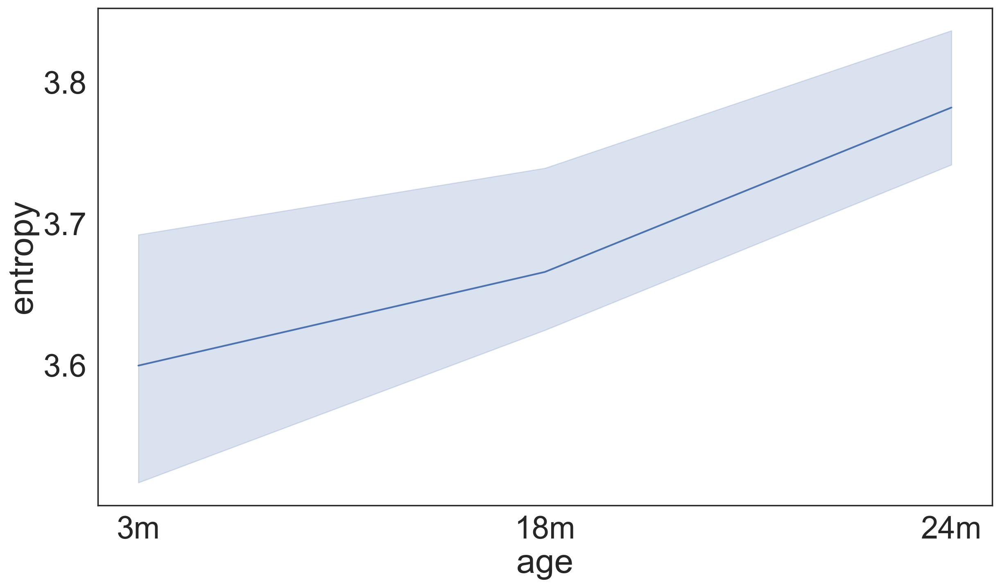

In [84]:
#ORIGINAL (linspace 500 bins)

sns.set(font_scale = 2.5)
sns.set_style("white")
#plt.rcParams['patch.edgecolor'] = 'none'
plt.figure(figsize=(14, 8))
plt.rcParams.update({'font.size': 22,'font.family':'sans-serif'})

sns.lineplot(data=new_animals_df, x='age',y='entropy')


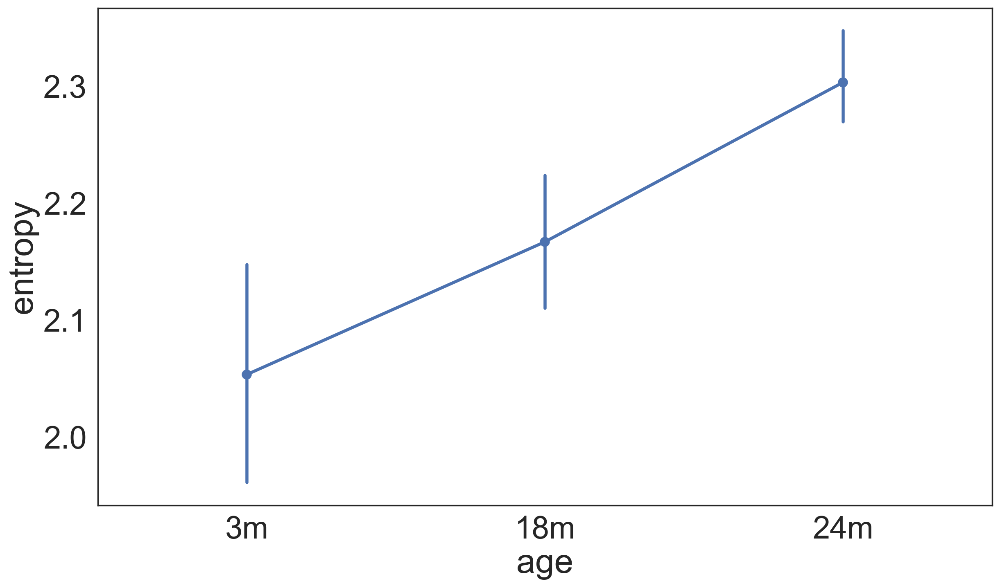

In [76]:
# modified (linspace 100 bins)

sns.set(font_scale = 2.5)
sns.set_style("white")
#plt.rcParams['patch.edgecolor'] = 'none'
plt.figure(figsize=(14, 8))
plt.rcParams.update({'font.size': 22,'font.family':'sans-serif'})

sns.pointplot(data=new_animals_df, x='age',y='entropy')

In [81]:
ent3_all=[]
ent18_all=[]
ent24_all=[]

ent3_all.append(entropy2(list(age3m)))
ent18_all.append(entropy2(list(age18m)))
ent24_all.append(entropy2(list(age24m)))
                      


In [83]:
entlist=ent3_all+ent18_all+ent24_all

<AxesSubplot:>

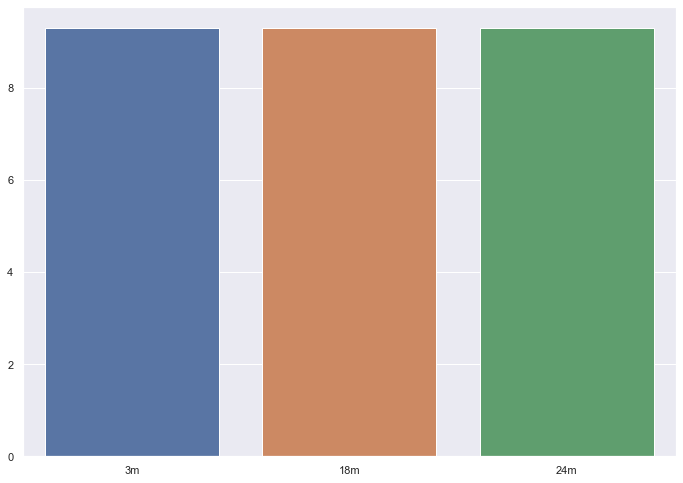

In [87]:
sns.barplot(y=entlist, x=['3m','18m','24m'])

*NOTE: All the entropy values are same because all the total counts value are unique. This is validated by checking the probability distrubution.*

Finding out optimal bin size :

In [88]:
print(ent3_all)
print(ent18_all)
print(ent24_all)

[9.29053691396814]
[9.29053691396814]
[9.29053691396814]


In [92]:
(age24m_df).shape

(1232, 10837)

In [106]:
ent, prob=entropy2((age18m))
print(prob)

[9.22934933e-05 9.22934933e-05 9.22934933e-05 ... 9.22934933e-05
 9.22934933e-05 9.22934933e-05]


In [105]:
ent, prob=entropy2((age24m))
print(prob)

[9.22934933e-05 9.22934933e-05 9.22934933e-05 ... 9.22934933e-05
 9.22934933e-05 9.22934933e-05]


In [101]:
entropy((age3m))

9.746091671565305

In [102]:
entropy((age24m))

9.139415708941097

In [108]:
from scipy.stats import entropy

In [111]:
counts = age3m.value_counts()
cnt=counts/len(counts)
entropy(cnt)

9.29053691397046

In [112]:
counts = age18m.value_counts()
cnt=counts/len(counts)
entropy(cnt)

9.29053691397046

In [114]:
1/len(age18m)

9.229349330872173e-05

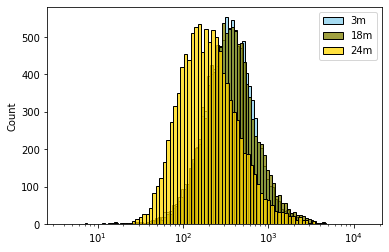

In [20]:
ax=sns.histplot(age3m, log_scale=True, color="skyblue",label='3m')
ax=sns.histplot(age18m,log_scale=True, color="olive", label='18m')
ax=sns.histplot(age24m, log_scale=True,color="gold", label='24m')
ax.legend()

In [228]:
age3m_mean

0610005C13Rik    0.000000
0610007C21Rik    0.562583
0610007L01Rik    0.616423
0610007N19Rik    0.261602
0610007P08Rik    0.241204
                   ...   
Zyg11a           0.009074
Zyg11b           0.349982
Zyx              0.711595
Zzef1            0.304026
Zzz3             0.398686
Length: 22966, dtype: float64

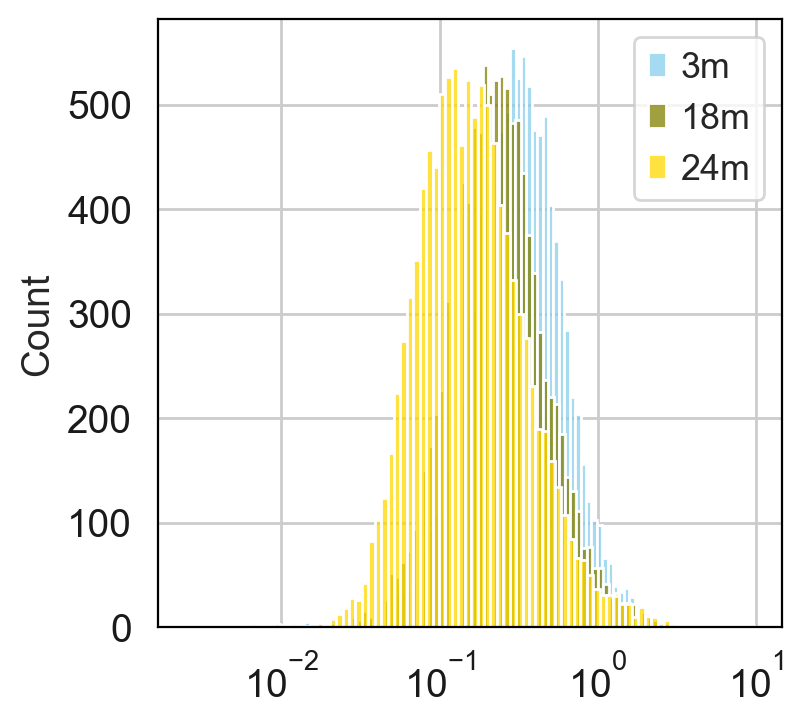

In [242]:
ns.set(font_scale = 2.5)
sns.set_style("white")
plt.rcParams['patch.edgecolor'] = 'none'
plt.figure(figsize=(14, 8))
plt.rcParams.update({'font.size': 22,'font.family':'sans-serif'})

ax=sns.histplot(age3m_mean, log_scale=True, color="skyblue",label='3m')
ax=sns.histplot(age18m_mean,log_scale=True, color="olive", label='18m')
ax=sns.histplot(age24m_mean, log_scale=True,color="gold", label='24m')
ax.legend()

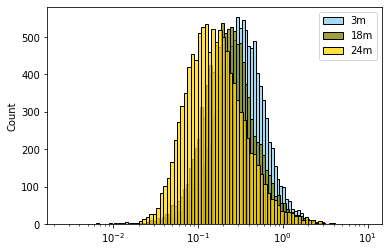

In [38]:
ax=sns.histplot(age3m_mean, log_scale=True, color="skyblue",label='3m')
ax=sns.histplot(age18m_mean,log_scale=True, color="olive", label='18m')
ax=sns.histplot(age24m_mean, log_scale=True,color="gold", label='24m')
ax.legend()

C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a fi

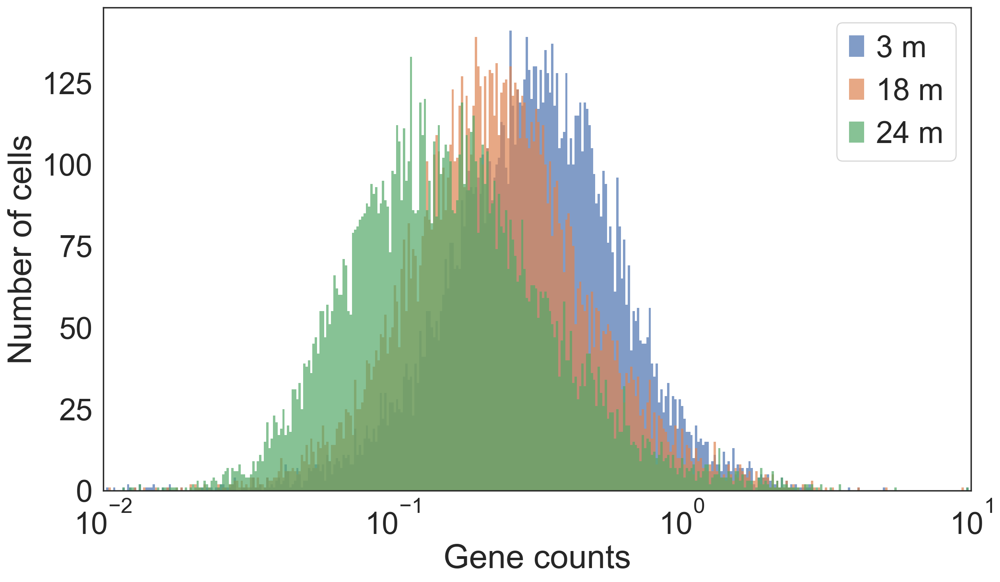

In [441]:
# ax=sns.histplot(age3m_mean, log_scale=True, color="skyblue",label='3m')
# ax=sns.histplot(age18m_mean,log_scale=True, color="olive", label='18m')
# ax=sns.histplot(age24m_mean, log_scale=True,color="gold", label='24m')
# ax.legend()

sns.set(font_scale = 2.5)
sns.set_style("white")
plt.rcParams['patch.edgecolor'] = 'none'
plt.figure(figsize=(14, 8))
plt.rcParams.update({'font.size': 22,'font.family':'sans-serif'})
for age,df in zip([3,18,24],[age3m_mean,age18m_mean,age24m_mean]):
    sns.distplot(df, label=str(age)+' m',
                 bins=np.logspace(np.log10(0.001),np.log10(10.0), 500),
                 #bins=600,
                 hist_kws={'alpha':0.7}, 
                 kde=False)
plt.legend()
plt.xscale('log')
plt.xlabel('Gene counts')
plt.ylabel('Number of cells')
plt.xlim(0.01,10)
plt.show()

C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a fi

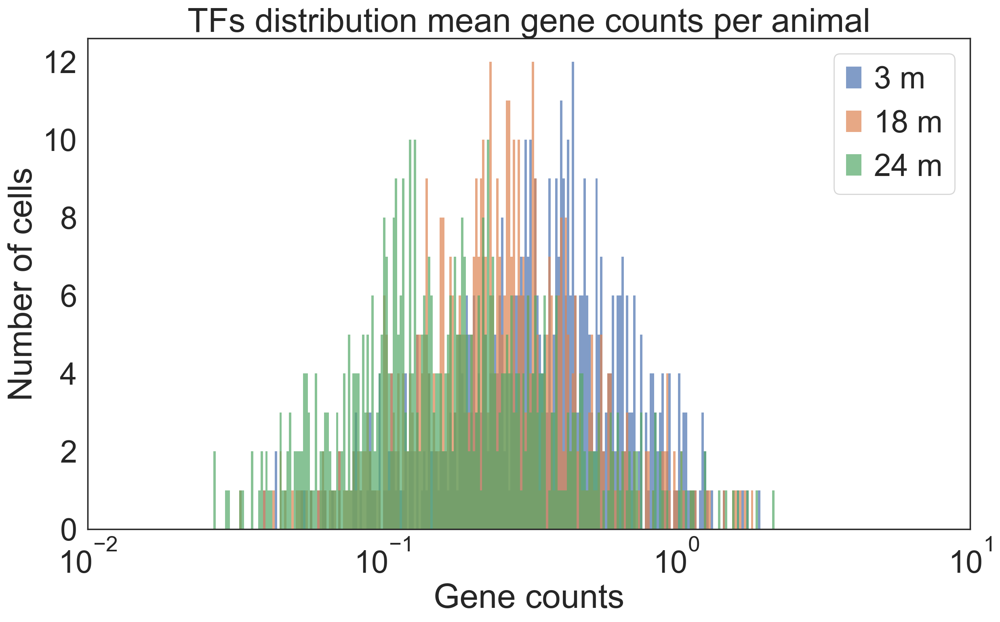

In [127]:
# Gene counts of TFs

sns.set(font_scale = 2.5)
sns.set_style("white")
plt.rcParams['patch.edgecolor'] = 'none'
plt.figure(figsize=(14, 8))
plt.rcParams.update({'font.size': 22,'font.family':'sans-serif'})
for age,df in zip([3,18,24],[age3m_mean[tf_in_genes],age18m_mean[tf_in_genes],age24m_mean[tf_in_genes]]):
    sns.distplot(df, label=str(age)+' m',
                 bins=np.logspace(np.log10(0.001),np.log10(10.0), 500),
                 #bins=600,
                 hist_kws={'alpha':0.7}, 
                 kde=False)
plt.legend()
plt.title('TFs distribution mean gene counts per animal')
plt.xscale('log')
plt.xlabel('Gene counts')
plt.ylabel('Number of cells')
plt.xlim(0.01,10)
plt.show()

C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a fi

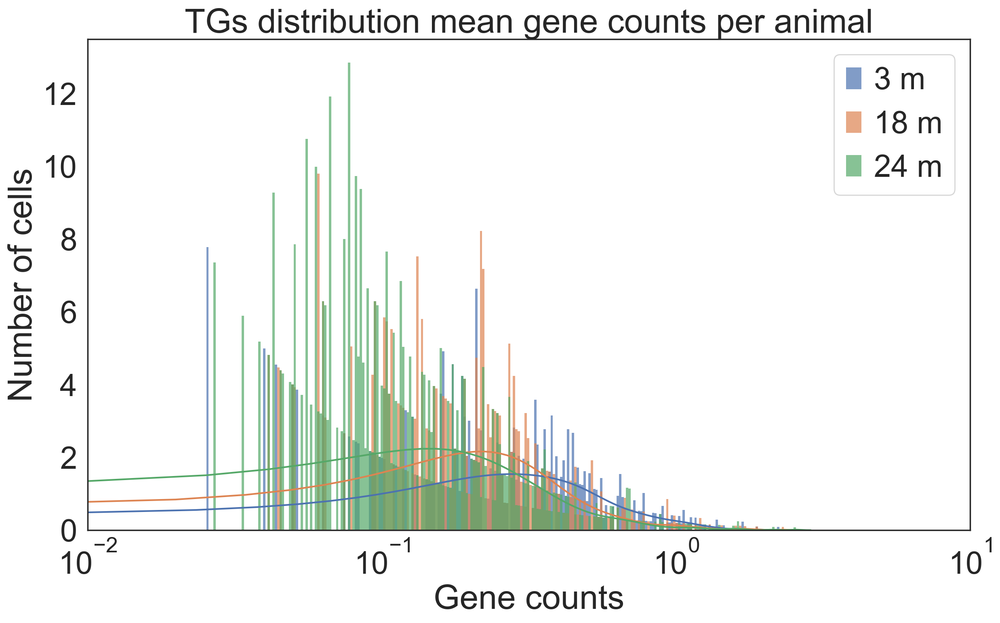

In [130]:
# Gene counts of TGs

sns.set(font_scale = 2.5)
sns.set_style("white")
plt.rcParams['patch.edgecolor'] = 'none'
plt.figure(figsize=(14, 8))
plt.rcParams.update({'font.size': 22,'font.family':'sans-serif'})
for age,df in zip([3,18,24],[age3m_mean[tg_in_genes],age18m_mean[tg_in_genes],age24m_mean[tg_in_genes]]):
    sns.distplot(df, label=str(age)+' m',
                 bins=np.logspace(np.log10(0.001),np.log10(10.0), 500),
                 #bins=600,
                 hist_kws={'alpha':0.7}, 
                 kde=True)
plt.legend()
plt.title('TGs distribution mean gene counts per animal')
plt.xscale('log')
plt.xlabel('Gene counts')
plt.ylabel('Number of cells')
plt.xlim(0.01,10)
plt.show()

Entropy of total counts vs entropy of means

In [41]:
counts3m = age3m.value_counts()
cnt3m=counts3m/len(counts3m)
ent_tot_3m=entropy(cnt3m)

counts18m = age18m.value_counts()
cnt18m=counts18m/len(counts18m)
ent_tot_18m=entropy(cnt18m)

counts24m = age24m.value_counts()
cnt24m=counts24m/len(counts24m)
ent_tot_24m=entropy(cnt24m)

In [44]:
print(ent_tot_3m)
print(ent_tot_18m)
print(ent_tot_24m)

9.29053691397046
9.29053691397046
9.29053691397046


In [254]:
age3m_mean_animal

counts3m_animal = age3m_mean_animal.value_counts()
cnt3m_animal=counts3m_animal/len(counts3m_animal)
ent_mean_3m_animal=entropy(cnt3m_animal)

In [255]:
ent_mean_3m_animal

1.791759469228055

In [244]:
counts3m = age3m_mean.value_counts()
cnt3m=counts3m/len(counts3m)
ent_mean_3m=entropy(cnt3m)

counts18m = age18m_mean.value_counts()
cnt18m=counts18m/len(counts18m)
ent_mean_18m=entropy(cnt18m)

counts24m = age24m_mean.value_counts()
cnt24m=counts24m/len(counts24m)
ent_mean_24m=entropy(cnt24m)

In [245]:
print(ent_mean_3m)
print(ent_mean_18m)
print(ent_mean_24m)

9.29053691397046
9.29053691397046
9.29053691397046


In [49]:
age18m_mean

0610007C21Rik    0.668275
0610007L01Rik    0.389955
0610007N19Rik    0.210504
0610007P08Rik    0.142548
0610007P14Rik    0.325052
                   ...   
Zxdc             0.195784
Zyg11b           0.162056
Zyx              0.751775
Zzef1            0.215381
Zzz3             0.164973
Length: 10835, dtype: float64

dividing list into bins/quantiles

In [72]:
age3m_mean.sort_values()

Slc39a5          0.006353
Upk1b            0.006797
1190003J15Rik    0.006828
Apoc1            0.007161
Nrxn2            0.008327
                   ...   
Hsp90ab1         2.829038
Eef1a1           3.771032
Actb             4.048469
Malat1           5.002341
Rn45s            9.699436
Length: 10835, dtype: float64

In [79]:
age3m_cut=pd.cut(age3m_mean, bins=2**np.linspace(0, 15, 500)).sort_index()

In [51]:
len(pd.qcut(age3m_mean, q=100))

10835

In [246]:
age3m_cut=pd.cut(age3m_mean, bins=2**np.linspace(0, 15, 500)).sort_index()
counts3m=age3m_cut.value_counts()
cnt3m=counts3m/len(counts3m)
ent_mean_3m=entropy(cnt3m)
print(ent_mean_3m)

3.593426245098117


In [287]:
age18m_cut=pd.cut(age18m_mean, bins=2**np.linspace(0, 15, 500)).sort_index()
counts18m=age18m_cut.value_counts()
cnt18m=counts18m/len(counts18m)
ent_mean_18m=entropy(cnt18m)
print(ent_mean_18m)

3.67256545915114


In [286]:
age24m_cut=pd.cut(age24m_mean, bins=2**np.linspace(0, 15, 500)).sort_index()
counts24m=age24m_cut.value_counts()
cnt24m=counts24m/len(counts24m)
ent_mean_24m=entropy(cnt24m)
print(ent_mean_24m)

3.7622550607424645


In [285]:
ent_mean= [ent_mean_3m]+[ent_mean_18m]+[ent_mean_24m]

In [99]:
ent_mean

[3.593426245098117, 3.67256545915114, 3.7622550607424645]

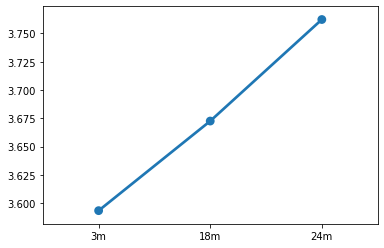

In [100]:
sns.pointplot(x=['3m','18m','24m'],y=ent_mean)

# Figure 1D and 1E

# calculating MI, entropy and conditional entropy for each cell.

In [102]:
allcells_df=pd.concat([age3m_df,age18m_df,age24m_df])

In [103]:
allcells_df.head()

,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610009B22Rik,0610009D07Rik,0610009L18Rik,0610009O20Rik,...,Zwint,Zxdc,Zyg11b,Zyx,Zzef1,Zzz3,age,celltype,animal_id,sex
A1.B002765.3_38_F.1.1-1-1,1.761104,1.541098,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,1.522642,0.0,0.000000,1.806709,0.000000,0.000000,3m,skeletal muscle satellite cell,3_38_F,female
A1.D042103.3_11_M.1-1-1,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,3m,skeletal muscle satellite cell,3_11_M,male
A1.D042186.3_8_M.1.1-1-1,0.000000,1.788955,0.0,0.0,0.0,0.0,0.000000,0.384158,0.0,0.000000,...,0.000000,0.0,0.161871,1.352870,1.701163,0.289918,3m,skeletal muscle satellite cell,3_8_M,male
A10.B002765.3_38_F.1.1-1-1,0.000000,3.050026,0.0,0.0,0.0,0.0,0.000000,1.533476,0.0,0.000000,...,0.025267,0.0,0.000000,0.000000,0.000000,0.000000,3m,skeletal muscle satellite cell,3_38_F,female
A10.B002769.3_39_F.1.1-1-1,1.564775,0.000000,0.0,0.0,0.0,0.0,2.696855,0.817633,0.0,1.073734,...,0.000000,0.0,0.029860,0.719527,0.024443,0.000000,3m,skeletal muscle satellite cell,3_39_F,female


In [104]:
lst=list(age3m_df.columns)
lst = lst[:len(lst)-4]

tftg_notin_genes=(np.unique(list(set(lst)- set(list(unique_dict.keys()))- set(list(unique_dict.values())))))

In [105]:
# entropy of all genes per cell
ent_cell_all=[]
df=allcells_df.iloc[: , :-4]

for cellid, row in df.iterrows():
    cell_all=pd.cut(row[tftg_notin_genes], bins=2**np.linspace(0, 15, 500)).sort_index()
    counts=cell_all.value_counts()
    cnt=counts/len(counts)
    ent_cell_all.append(entropy(cnt))
    
    

In [109]:
df

,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610009B22Rik,0610009D07Rik,0610009L18Rik,0610009O20Rik,...,Zufsp,Zw10,Zwint,Zxdc,Zyg11b,Zyx,Zzef1,Zzz3,nottftg_genes_entropy,age
A1.B002765.3_38_F.1.1-1-1,1.761104,1.541098,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,0.0,0.0,1.522642,0.0,0.000000,1.806709,0.000000,0.000000,4.345901,3m
A1.D042103.3_11_M.1-1-1,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,4.427188,3m
A1.D042186.3_8_M.1.1-1-1,0.000000,1.788955,0.0,0.0,0.0,0.0,0.000000,0.384158,0.0,0.000000,...,0.0,0.0,0.000000,0.0,0.161871,1.352870,1.701163,0.289918,4.422405,3m
A10.B002765.3_38_F.1.1-1-1,0.000000,3.050026,0.0,0.0,0.0,0.0,0.000000,1.533476,0.0,0.000000,...,0.0,0.0,0.025267,0.0,0.000000,0.000000,0.000000,0.000000,4.435152,3m
A10.B002769.3_39_F.1.1-1-1,1.564775,0.000000,0.0,0.0,0.0,0.0,2.696855,0.817633,0.0,1.073734,...,0.0,0.0,0.000000,0.0,0.029860,0.719527,0.024443,0.000000,4.359272,3m
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P7_B003847_S367_L003.mus-6-0-1,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.875063,0.0,0.000000,...,0.0,0.0,0.000000,0.0,0.000000,0.049781,0.000000,0.000000,4.480629,24m
P7_B003863_S367_L003.mus-6-0-1,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,0.0,0.0,0.000000,0.0,0.000000,1.398477,0.000000,0.000000,4.547924,24m
P8_B003847_S368_L003.mus-6-0-1,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,3.568880,0.0,0.000000,...,0.0,0.0,0.000000,0.0,2.276453,0.000000,0.000000,0.000000,4.456493,24m
P8_B003863_S368_L003.mus-6-0-1,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,4.487869,24m


Text(0.5, 1.0, 'genes not in transcriptional regulatory network')

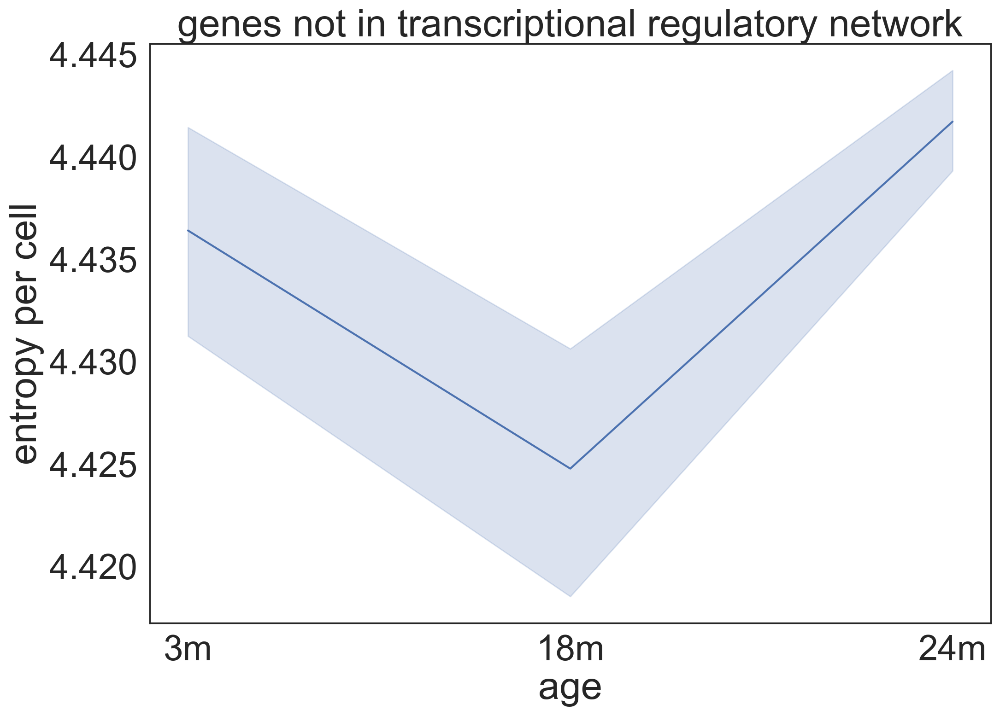

In [113]:
df['nottftg_genes_entropy'] = ent_cell_all
df['age']=allcells_df['age']

sns.lineplot(data=df, x= 'age', y= 'nottftg_genes_entropy')
plt.ylabel('entropy per cell')
plt.title('genes not in transcriptional regulatory network')

In [114]:
present_tf_tg_dict

{'Aatf': 'Trp53',
 'Aebp2': 'Snai2',
 'Ahr': 'Vav3',
 'Apbb1': 'Notch1',
 'Apc': 'Trp53',
 'Apex1': 'Tlr4',
 'Arid5b': 'Sox9',
 'Arl6ip5': 'Xrcc1',
 'Ash1l': 'Timp1',
 'Asxl1': 'Fabp4',
 'Atf1': 'Thbs1',
 'Atf3': 'Tnfrsf10b',
 'Atf4': 'Trib3',
 'Atf6': 'Wbp1',
 'Atm': 'Trp53',
 'Bach1': 'Trp53',
 'Batf3': 'Irf8',
 'Bcl11b': 'Zbtb7b',
 'Bcl3': 'Ubc',
 'Bcl6b': 'Rbpj',
 'Bhlhe40': 'Il2ra',
 'Bmi1': 'Pten',
 'Bmp4': 'Chst11',
 'Brca2': 'Cdkn1a',
 'Btg2': 'Creb1',
 'Bub3': 'Apod',
 'Cd7': 'Nfkb1',
 'Cebpa': 'Zbtb16',
 'Cebpg': 'Il6',
 'Cebpz': 'Hspa1b',
 'Chd7': 'Sox4',
 'Chd8': 'Tcf4',
 'Cited2': 'Wnt4',
 'Clock': 'Vwf',
 'Cnot3': 'Zfx',
 'Cnot7': 'Tob1',
 'Creb1': 'Twist1',
 'Creb3': 'Herpud1',
 'Crebbp': 'Trp53',
 'Crtc1': 'Creb1',
 'Cry1': 'Per2',
 'Csf1': 'Cd36',
 'Ctf1': 'Tgfb1',
 'Ctnnb1': 'Wnt4',
 'Ctr9': 'Il6',
 'Dab2': 'Axin1',
 'Daxx': 'Trp53',
 'Dbp': 'Per1',
 'Ddit3': 'Nos3',
 'Ddx5': 'Igf2',
 'Ddx54': 'Mbp',
 'Deaf1': 'Eif4g3',
 'Dmap1': 'Bmi1',
 'Dmrt2': 'Myf5',
 'Dnajc2': '

In [115]:
df_sub=allcells_df.iloc[: , :-4]
df_sub.head()

,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610009B22Rik,0610009D07Rik,0610009L18Rik,0610009O20Rik,...,Zswim6,Zswim7,Zufsp,Zw10,Zwint,Zxdc,Zyg11b,Zyx,Zzef1,Zzz3
A1.B002765.3_38_F.1.1-1-1,1.761104,1.541098,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,0.000000,0.000000,0.0,0.0,1.522642,0.0,0.000000,1.806709,0.000000,0.000000
A1.D042103.3_11_M.1-1-1,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,6.832855,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
A1.D042186.3_8_M.1.1-1-1,0.000000,1.788955,0.0,0.0,0.0,0.0,0.000000,0.384158,0.0,0.000000,...,3.882913,0.000000,0.0,0.0,0.000000,0.0,0.161871,1.352870,1.701163,0.289918
A10.B002765.3_38_F.1.1-1-1,0.000000,3.050026,0.0,0.0,0.0,0.0,0.000000,1.533476,0.0,0.000000,...,0.000000,0.000000,0.0,0.0,0.025267,0.0,0.000000,0.000000,0.000000,0.000000
A10.B002769.3_39_F.1.1-1-1,1.564775,0.000000,0.0,0.0,0.0,0.0,2.696855,0.817633,0.0,1.073734,...,0.000000,1.812647,0.0,0.0,0.000000,0.0,0.029860,0.719527,0.024443,0.000000


In [116]:
def cell_entropy(df,present_tf_tg_dict):
    '''
    df: dataframe with genes as columns, cells as rows, with 'animal_id' as a column
    present_tf_tg_dict: dictionary of tf and tg - present pairs in the data
    ''' 
    
    ent_cell_tf=[]
    ent_cell_tg=[]
    
    df=df.iloc[: , :-4]
    
    for cellid, row in df.iterrows():
        
        cell_tf=pd.cut(row[present_tf_tg_dict.keys()], bins=2**np.linspace(0, 15, 500)).sort_index()
        counts=cell_tf.value_counts()
        cnt=counts/len(counts)
        ent_cell_tf.append(entropy(cnt))
        
        cell_tg=pd.cut(row[present_tf_tg_dict.values()], bins=2**np.linspace(0, 15, 500)).sort_index()
        counts=cell_tg.value_counts()
        cnt=counts/len(counts)
        ent_cell_tg.append(entropy(cnt))

            
    return ent_cell_tf,ent_cell_tg

In [117]:
ent_cell_tf,ent_cell_tg = cell_entropy(allcells_df,present_tf_tg_dict)

C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:2751: RuntimeWarning: invalid value encountered in true_divide
  pk = 1.0*pk / np.sum(pk, axis=axis, keepdims=True)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:2751: RuntimeWarning: invalid value encountered in true_divide
  pk = 1.0*pk / np.sum(pk, axis=axis, keepdims=True)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:2751: RuntimeWarning: invalid value encountered in true_divide
  pk = 1.0*pk / np.sum(pk, axis=axis, keepdims=True)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:2751: RuntimeWarning: invalid value encountered in true_divide
  pk = 1.0*pk / np.sum(pk, axis=axis, keepdims=True)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:2751: RuntimeWar

In [118]:
ent_cell_tf

[3.4611552603613758,
 3.248189295336033,
 3.8324955855544043,
 3.6507469498963614,
 3.5608410405230675,
 3.6854232697417526,
 3.524627420627918,
 3.6750185399929345,
 3.7832688305846682,
 3.4001489161702443,
 3.4973882053700858,
 3.885147559115742,
 3.4628012875668173,
 3.9205395969225707,
 3.6101948365048746,
 3.5307547044261387,
 3.2954835967305027,
 3.5143238662459586,
 3.366410076076379,
 3.564610524292939,
 3.713319646451699,
 3.485067166024883,
 3.5225573824405223,
 3.223530831983023,
 3.347141715127149,
 3.74675342514005,
 3.4334467238616124,
 3.78109806523672,
 3.350800815673733,
 3.7578553963354713,
 3.2101676771053285,
 3.5982245480093313,
 3.7948058812406416,
 3.382229551511053,
 3.691621994434027,
 3.626052432511112,
 3.747916229059472,
 3.4611552603613758,
 3.641403233043423,
 3.718252790738791,
 3.5256957299585947,
 3.495746288104587,
 3.6416091985121657,
 3.090459923616197,
 3.2452324781809123,
 3.678207724570945,
 2.197224577336219,
 3.6750185399929345,
 3.6292239064009

In [143]:
# ordered age
ent_cell_tf,ent_cell_tg = cell_entropy(df,present_tf_tg_dict)

C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:2751: RuntimeWarning: invalid value encountered in true_divide
  pk = 1.0*pk / np.sum(pk, axis=axis, keepdims=True)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:2751: RuntimeWarning: invalid value encountered in true_divide
  pk = 1.0*pk / np.sum(pk, axis=axis, keepdims=True)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:2751: RuntimeWarning: invalid value encountered in true_divide
  pk = 1.0*pk / np.sum(pk, axis=axis, keepdims=True)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:2751: RuntimeWarning: invalid value encountered in true_divide
  pk = 1.0*pk / np.sum(pk, axis=axis, keepdims=True)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:2751: RuntimeWar

In [119]:
def cell_mi(df,present_tf_tg_dict):
    '''
    df: dataframe with genes as columns, animals as rows
    unique_dict: tf-tg pairs as a dict
    ''' 
    mi_cell=[]
    count=0
    
    df=df.iloc[: , :-4]
    
    for cellid, row in df.iterrows():
        
        try:
            mi_cell.append(calc_normMI(list(row[list(present_tf_tg_dict.keys())]),list(row[list(present_tf_tg_dict.values())])))

        except:
            count+=1
            pass
    
    
    return mi_cell

In [120]:
mi_cell=cell_mi(allcells_df,present_tf_tg_dict)

In [ ]:
#ordered age
mi_cell=cell_mi(df,present_tf_tg_dict)

In [121]:
allcells_df['entropy_cell_tf']=ent_cell_tf
allcells_df['entropy_cell_tg']=ent_cell_tg
allcells_df['mi_cell']=mi_cell
allcells_df['condi_tf|tg_cell']=allcells_df['entropy_cell_tf']-allcells_df['mi_cell']
allcells_df['condi_tg|tf_cell']=allcells_df['entropy_cell_tg']-allcells_df['mi_cell']

In [122]:
allcells_df.head()

,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610009B22Rik,0610009D07Rik,0610009L18Rik,0610009O20Rik,...,Zzz3,age,celltype,animal_id,sex,entropy_cell_tf,entropy_cell_tg,mi_cell,condi_tf|tg_cell,condi_tg|tf_cell
A1.B002765.3_38_F.1.1-1-1,1.761104,1.541098,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,0.000000,3m,skeletal muscle satellite cell,3_38_F,female,3.461155,2.787838,0.237433,3.223722,2.550405
A1.D042103.3_11_M.1-1-1,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,0.000000,3m,skeletal muscle satellite cell,3_11_M,male,3.248189,2.821225,0.130448,3.117741,2.690777
A1.D042186.3_8_M.1.1-1-1,0.000000,1.788955,0.0,0.0,0.0,0.0,0.000000,0.384158,0.0,0.000000,...,0.289918,3m,skeletal muscle satellite cell,3_8_M,male,3.832496,2.964179,0.341543,3.490953,2.622636
A10.B002765.3_38_F.1.1-1-1,0.000000,3.050026,0.0,0.0,0.0,0.0,0.000000,1.533476,0.0,0.000000,...,0.000000,3m,skeletal muscle satellite cell,3_38_F,female,3.650747,2.395799,0.239135,3.411612,2.156664
A10.B002769.3_39_F.1.1-1-1,1.564775,0.000000,0.0,0.0,0.0,0.0,2.696855,0.817633,0.0,1.073734,...,0.000000,3m,skeletal muscle satellite cell,3_39_F,female,3.560841,2.667208,0.384550,3.176291,2.282658


In [146]:
df['entropy_cell_tf']=ent_cell_tf
df['entropy_cell_tg']=ent_cell_tg
df['mi_cell']=mi_cell
df['condi_tf|tg_cell']=df['entropy_cell_tf']-df['mi_cell']
df['condi_tg|tf_cell']=df['entropy_cell_tg']-df['mi_cell']

In [124]:
avg_allcells_df=allcells_df.groupby('age').mean()

In [147]:
# sorted age
avg_allcells_df=df.groupby('age').mean()

In [157]:
avg_allcells_df.index

Index(['18m', '24m', '3m'], dtype='object', name='age')

In [158]:
avg_allcells_df=avg_allcells_df.reindex(['3m','18m', '24m'])


In [159]:
final_df = avg_allcells_df

In [160]:
final_df

,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610009B22Rik,0610009D07Rik,0610009L18Rik,0610009O20Rik,...,Zyg11b,Zyx,Zzef1,Zzz3,nottftg_genes_entropy,entropy_cell_tf,entropy_cell_tg,mi_cell,condi_tf|tg_cell,condi_tg|tf_cell
age,,,,,,,,,,,,,,,,,,,,,
3m,0.562583,0.616423,0.261602,0.241204,0.271822,0.176797,0.145984,0.657250,0.109040,0.310804,...,0.349982,0.711595,0.304026,0.398686,4.436410,3.550821,2.975948,0.286551,3.264270,2.689398
18m,0.668275,0.389955,0.210504,0.142548,0.325052,0.229634,0.249936,0.617684,0.163875,0.190684,...,0.162056,0.751775,0.215381,0.164973,4.424782,3.281333,2.740609,0.240707,3.040529,2.499422
24m,0.564742,0.293902,0.224080,0.055116,0.164437,0.183997,0.117577,0.518939,0.104389,0.103133,...,0.115579,0.581208,0.142874,0.145802,4.441727,3.164327,2.635886,0.153976,3.010350,2.481910


Relative change in MI and condi entropy:

3m :
MI    = 0.286551 
CONDI = 2.689398



In [130]:
#Proportion of useful information wrt input

# (MI / input entropy) in 3m

print('3m: ', 0.286551/3.550821)

# (MI / input entropy) in 18m
print('18m: ',0.240707/3.281333)

# (MI / input entropy) in 24m
print('24m: ',0.153976/3.164327)

3m:  0.08069992827010992
18m:  0.07335646824019385
24m:  0.04865995202139349


In [129]:
# #Proportion of useful information wrt output

# # (MI / output entropy) in 3m
# print('3m: ',0.286551/2.975948)

# # (MI / output entropy) in 18m
# print('18m: ',0.240707/2.740609)

# # (MI / output entropy) in 24m
# print('24m: ',0.153976/2.635886)

In [131]:
# proportion of condi output to input

# (conditional entropy of output given input / input entropy) in 3m

print('3m: ', 2.689398/3.550821)

# (MI / input entropy) in 18m
print('18m: ',2.499422/3.281333)

# (MI / input entropy) in 24m
print('24m: ',2.481910/3.164327)

3m:  0.7574017389217874
18m:  0.7617093419046467
24m:  0.7843405564595568


In [132]:
# # proportion of condi output to output

# # (conditional entropy of output given input / output entropy) in 3m

# print('3m: ', 2.689398/2.975948)

# # (MI / input entropy) in 18m
# print('18m: ',2.499422/2.740609)

# # (MI / input entropy) in 24m
# print('24m: ',2.481910/2.635886)

In [161]:
final_df

,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610009B22Rik,0610009D07Rik,0610009L18Rik,0610009O20Rik,...,Zyg11b,Zyx,Zzef1,Zzz3,nottftg_genes_entropy,entropy_cell_tf,entropy_cell_tg,mi_cell,condi_tf|tg_cell,condi_tg|tf_cell
age,,,,,,,,,,,,,,,,,,,,,
3m,0.562583,0.616423,0.261602,0.241204,0.271822,0.176797,0.145984,0.657250,0.109040,0.310804,...,0.349982,0.711595,0.304026,0.398686,4.436410,3.550821,2.975948,0.286551,3.264270,2.689398
18m,0.668275,0.389955,0.210504,0.142548,0.325052,0.229634,0.249936,0.617684,0.163875,0.190684,...,0.162056,0.751775,0.215381,0.164973,4.424782,3.281333,2.740609,0.240707,3.040529,2.499422
24m,0.564742,0.293902,0.224080,0.055116,0.164437,0.183997,0.117577,0.518939,0.104389,0.103133,...,0.115579,0.581208,0.142874,0.145802,4.441727,3.164327,2.635886,0.153976,3.010350,2.481910


In [162]:
allcells_df

,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610009B22Rik,0610009D07Rik,0610009L18Rik,0610009O20Rik,...,celltype,animal_id,sex,entropy_cell_tf,entropy_cell_tg,mi_cell,condi_tf|tg_cell,condi_tg|tf_cell,mi_minus_inputent,mi_per_inputent
A1.B002765.3_38_F.1.1-1-1,1.761104,1.541098,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,skeletal muscle satellite cell,3_38_F,female,3.461155,2.787838,0.237433,3.223722,2.550405,-3.223722,0.068599
A1.D042103.3_11_M.1-1-1,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,skeletal muscle satellite cell,3_11_M,male,3.248189,2.821225,0.130448,3.117741,2.690777,-3.117741,0.040160
A1.D042186.3_8_M.1.1-1-1,0.000000,1.788955,0.0,0.0,0.0,0.0,0.000000,0.384158,0.0,0.000000,...,skeletal muscle satellite cell,3_8_M,male,3.832496,2.964179,0.341543,3.490953,2.622636,-3.490953,0.089118
A10.B002765.3_38_F.1.1-1-1,0.000000,3.050026,0.0,0.0,0.0,0.0,0.000000,1.533476,0.0,0.000000,...,skeletal muscle satellite cell,3_38_F,female,3.650747,2.395799,0.239135,3.411612,2.156664,-3.411612,0.065503
A10.B002769.3_39_F.1.1-1-1,1.564775,0.000000,0.0,0.0,0.0,0.0,2.696855,0.817633,0.0,1.073734,...,skeletal muscle satellite cell,3_39_F,female,3.560841,2.667208,0.384550,3.176291,2.282658,-3.176291,0.107994
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P7_B003847_S367_L003.mus-6-0-1,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.875063,0.0,0.000000,...,T cell,24_60_M,male,3.494504,3.319959,0.273044,3.221460,3.046916,-3.221460,0.078135
P7_B003863_S367_L003.mus-6-0-1,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,T cell,24_61_M,male,3.244454,2.670348,0.125368,3.119086,2.544980,-3.119086,0.038641
P8_B003847_S368_L003.mus-6-0-1,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,3.568880,0.0,0.000000,...,B cell,24_60_M,male,3.120292,2.623522,0.046417,3.073874,2.577104,-3.073874,0.014876
P8_B003863_S368_L003.mus-6-0-1,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,T cell,24_61_M,male,2.889243,2.437125,0.094829,2.794413,2.342296,-2.794413,0.032821


In [163]:
final_df['mi_per_inputent']= final_df['mi_cell'] / final_df['entropy_cell_tf']


In [1]:
#sns.lineplot(data=final_df, x='age',y='mi_per_inputent')

Text(0, 0.5, 'normalized noise in output')

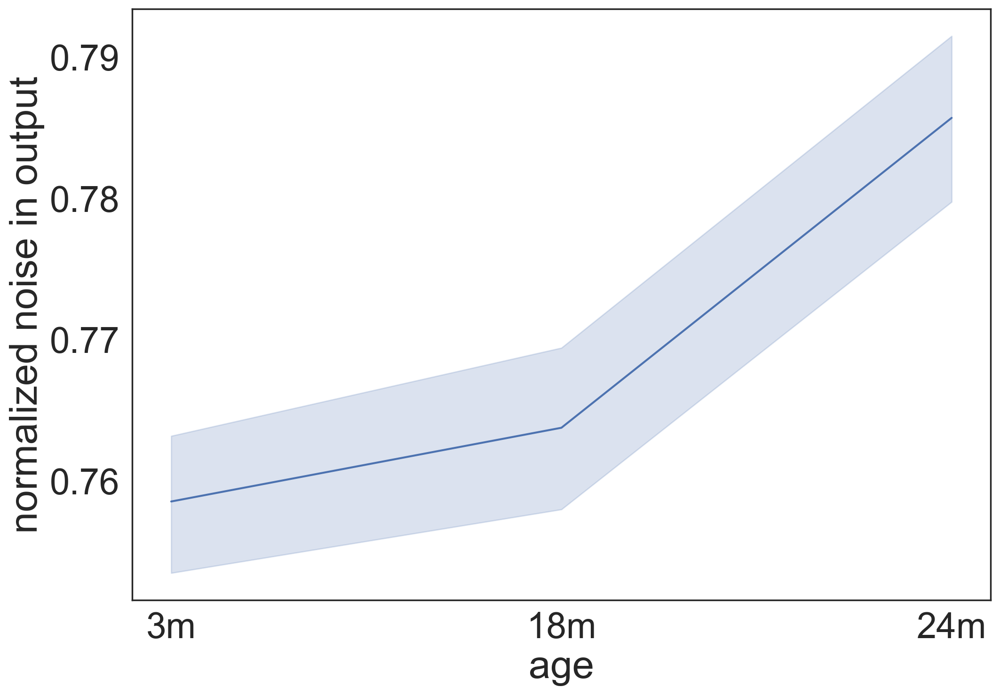

In [194]:
allcells_df['conditg_per_inputent']= allcells_df['condi_tg|tf_cell'] / allcells_df['entropy_cell_tf']
clean_allcells_df=allcells_df.replace([np.inf, -np.inf], np.nan).dropna(axis=0)
sns.lineplot(data=clean_allcells_df, x='age',y='conditg_per_inputent')
plt.ylabel('normalized noise in output')

In [165]:
# dont know why averaging per cell does not work -- zero values of entropy!!!!
allcells_df['mi_per_inputent']= allcells_df['mi_cell'] / allcells_df['entropy_cell_tf']

In [188]:
clean_allcells_df=allcells_df.replace([np.inf, -np.inf], np.nan).dropna(axis=0)

Text(0, 0.5, 'normalized useful information')

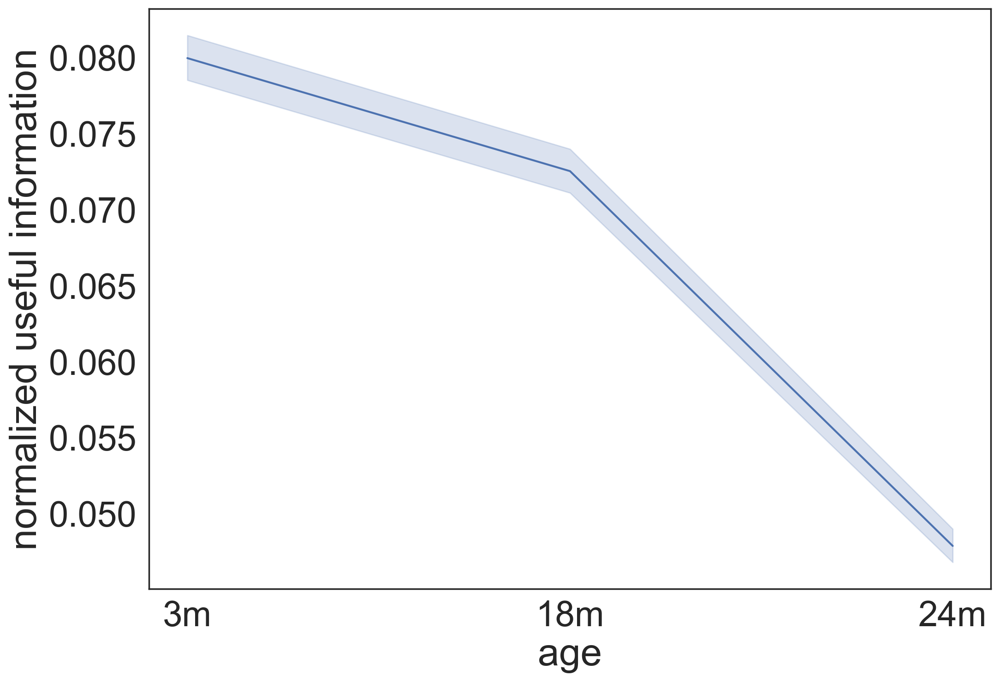

In [193]:
sns.lineplot(data=clean_allcells_df, x='age',y='mi_per_inputent')
plt.ylabel('normalized useful information')

C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a fi

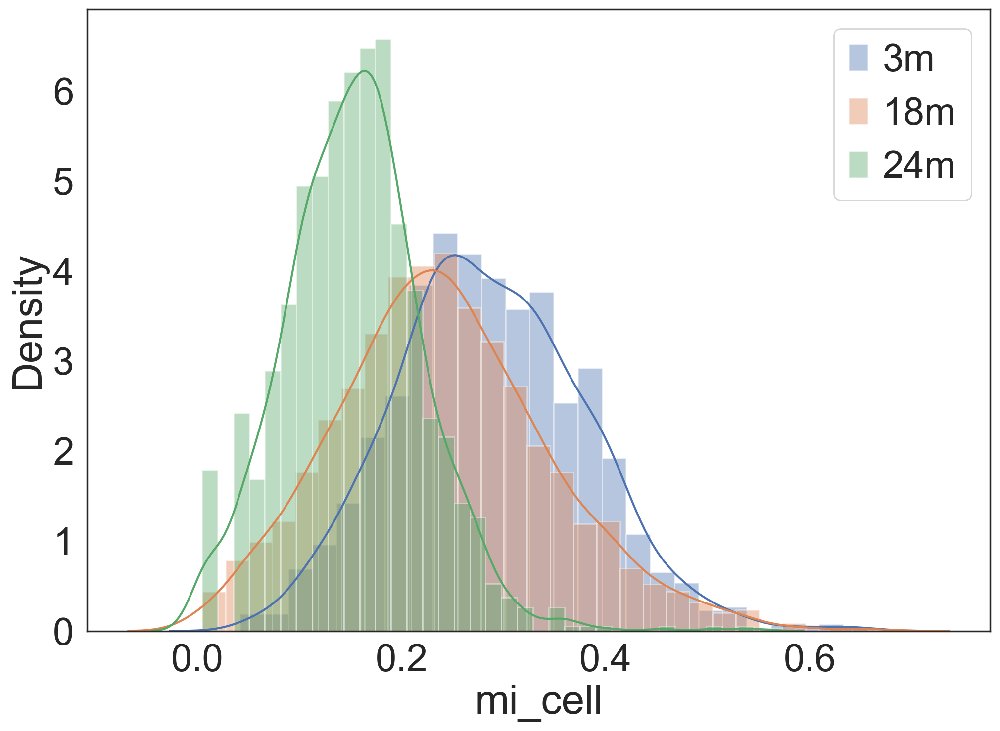

In [438]:

ax=sns.distplot( allcells_df[allcells_df['age']=='3m']['mi_cell'], label='3m')
ax=sns.distplot( allcells_df[allcells_df['age']=='18m']['mi_cell'], label='18m')
ax=sns.distplot( allcells_df[allcells_df['age']=='24m']['mi_cell'], label='24m')
ax.legend()

C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a fi

Text(0.5, 0, 'MI per cell with normalized input')

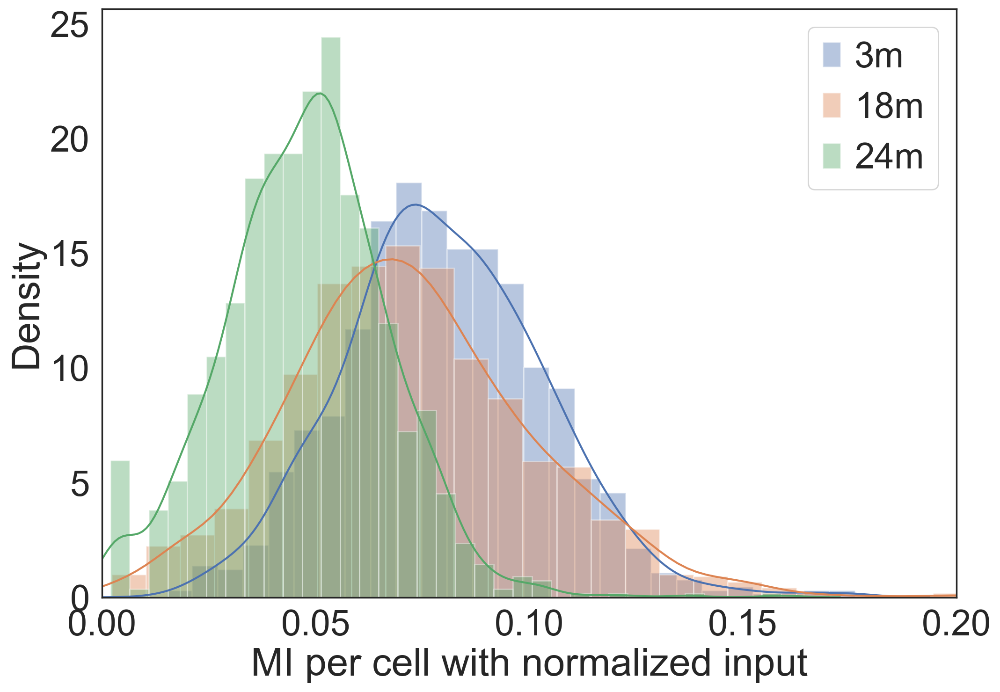

In [179]:

clean_allcells_df=allcells_df.replace([np.inf, -np.inf], np.nan).dropna(axis=0)

ax=sns.distplot( clean_allcells_df[clean_allcells_df['age']=='3m']['mi_per_inputent'], label='3m')
ax=sns.distplot( clean_allcells_df[clean_allcells_df['age']=='18m']['mi_per_inputent'], label='18m')
ax=sns.distplot( clean_allcells_df[clean_allcells_df['age']=='24m']['mi_per_inputent'], label='24m')
ax.legend()
plt.xlim([0,0.2])
plt.xlabel('MI per cell with normalized input')

C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a fi

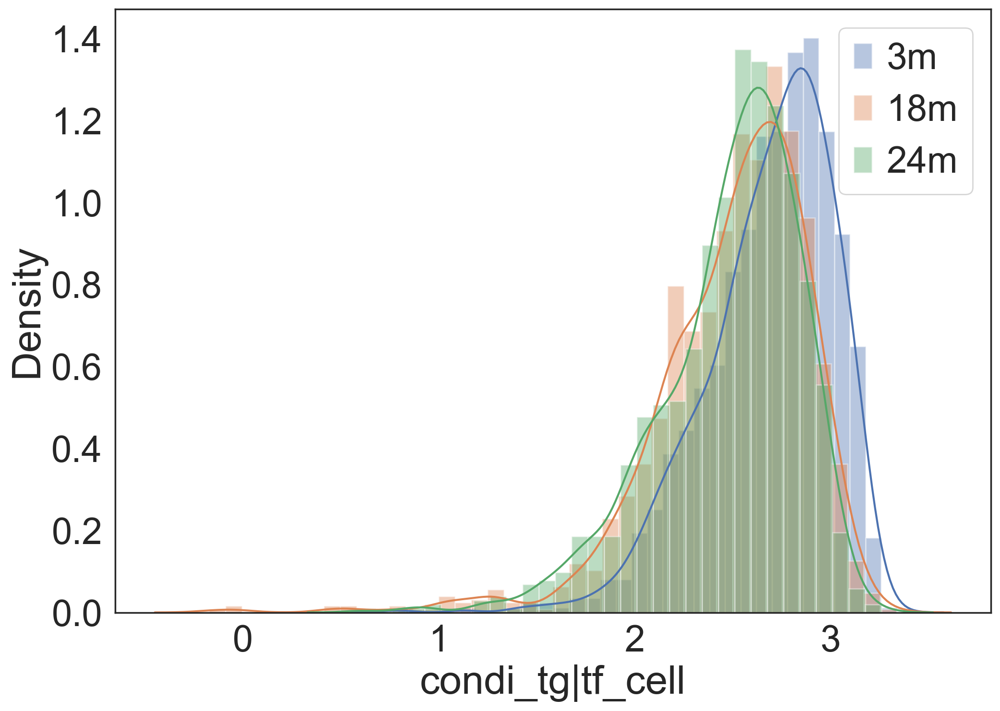

In [439]:
ax=sns.distplot( allcells_df[allcells_df['age']=='3m']['condi_tg|tf_cell'], label='3m')
ax=sns.distplot( allcells_df[allcells_df['age']=='18m']['condi_tg|tf_cell'], label='18m')
ax=sns.distplot( allcells_df[allcells_df['age']=='24m']['condi_tg|tf_cell'], label='24m')
ax.legend()

In [181]:
clean_allcells_df

,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610009B22Rik,0610009D07Rik,0610009L18Rik,0610009O20Rik,...,animal_id,sex,entropy_cell_tf,entropy_cell_tg,mi_cell,condi_tf|tg_cell,condi_tg|tf_cell,mi_minus_inputent,mi_per_inputent,ce_per_inputent
A1.B002765.3_38_F.1.1-1-1,1.761104,1.541098,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,3_38_F,female,3.461155,2.787838,0.237433,3.223722,2.550405,-3.223722,0.068599,0.736865
A1.D042103.3_11_M.1-1-1,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,3_11_M,male,3.248189,2.821225,0.130448,3.117741,2.690777,-3.117741,0.040160,0.828393
A1.D042186.3_8_M.1.1-1-1,0.000000,1.788955,0.0,0.0,0.0,0.0,0.000000,0.384158,0.0,0.000000,...,3_8_M,male,3.832496,2.964179,0.341543,3.490953,2.622636,-3.490953,0.089118,0.684316
A10.B002765.3_38_F.1.1-1-1,0.000000,3.050026,0.0,0.0,0.0,0.0,0.000000,1.533476,0.0,0.000000,...,3_38_F,female,3.650747,2.395799,0.239135,3.411612,2.156664,-3.411612,0.065503,0.590746
A10.B002769.3_39_F.1.1-1-1,1.564775,0.000000,0.0,0.0,0.0,0.0,2.696855,0.817633,0.0,1.073734,...,3_39_F,female,3.560841,2.667208,0.384550,3.176291,2.282658,-3.176291,0.107994,0.641045
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P7_B003847_S367_L003.mus-6-0-1,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.875063,0.0,0.000000,...,24_60_M,male,3.494504,3.319959,0.273044,3.221460,3.046916,-3.221460,0.078135,0.871916
P7_B003863_S367_L003.mus-6-0-1,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,24_61_M,male,3.244454,2.670348,0.125368,3.119086,2.544980,-3.119086,0.038641,0.784409
P8_B003847_S368_L003.mus-6-0-1,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,3.568880,0.0,0.000000,...,24_60_M,male,3.120292,2.623522,0.046417,3.073874,2.577104,-3.073874,0.014876,0.825918
P8_B003863_S368_L003.mus-6-0-1,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,24_61_M,male,2.889243,2.437125,0.094829,2.794413,2.342296,-2.794413,0.032821,0.810695


C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a fi

Text(0.5, 0, 'CE per cell with normalized input')

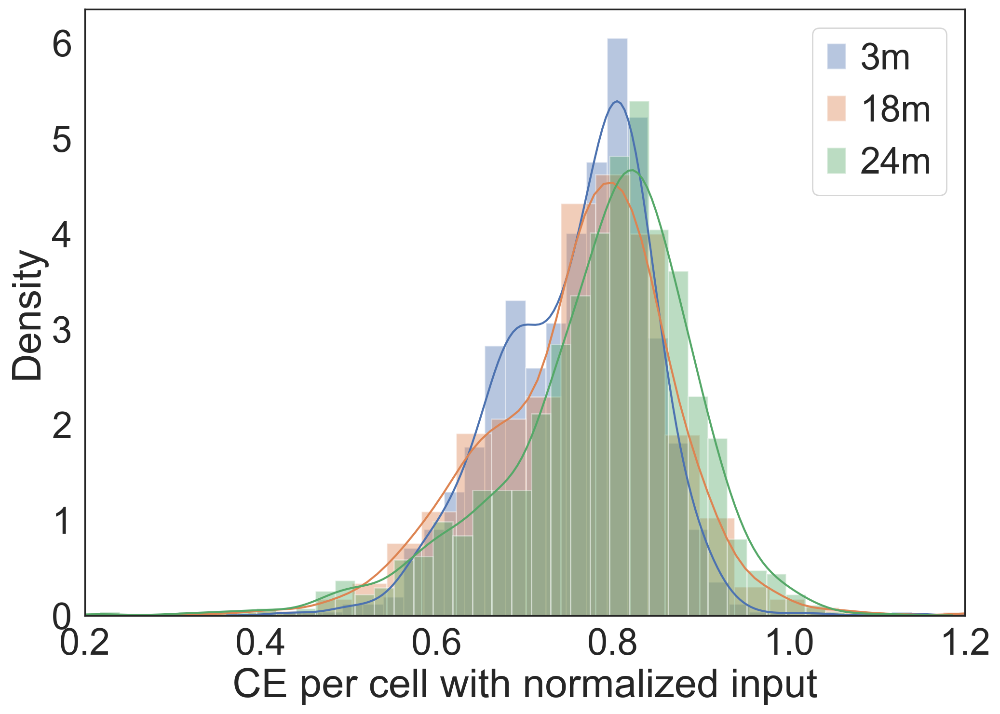

In [187]:
allcells_df['ce_per_inputent']= allcells_df['condi_tg|tf_cell'] / allcells_df['entropy_cell_tf']
clean_allcells_df=allcells_df.replace([np.inf, -np.inf], np.nan).dropna(axis=0)

ax=sns.distplot( clean_allcells_df[clean_allcells_df['age']=='3m']['ce_per_inputent'], label='3m')
ax=sns.distplot( clean_allcells_df[clean_allcells_df['age']=='18m']['ce_per_inputent'], label='18m')
ax=sns.distplot( clean_allcells_df[clean_allcells_df['age']=='24m']['ce_per_inputent'], label='24m')
ax.legend()
plt.xlim([0.2,1.2])
plt.xlabel('CE per cell with normalized input')

C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a fi

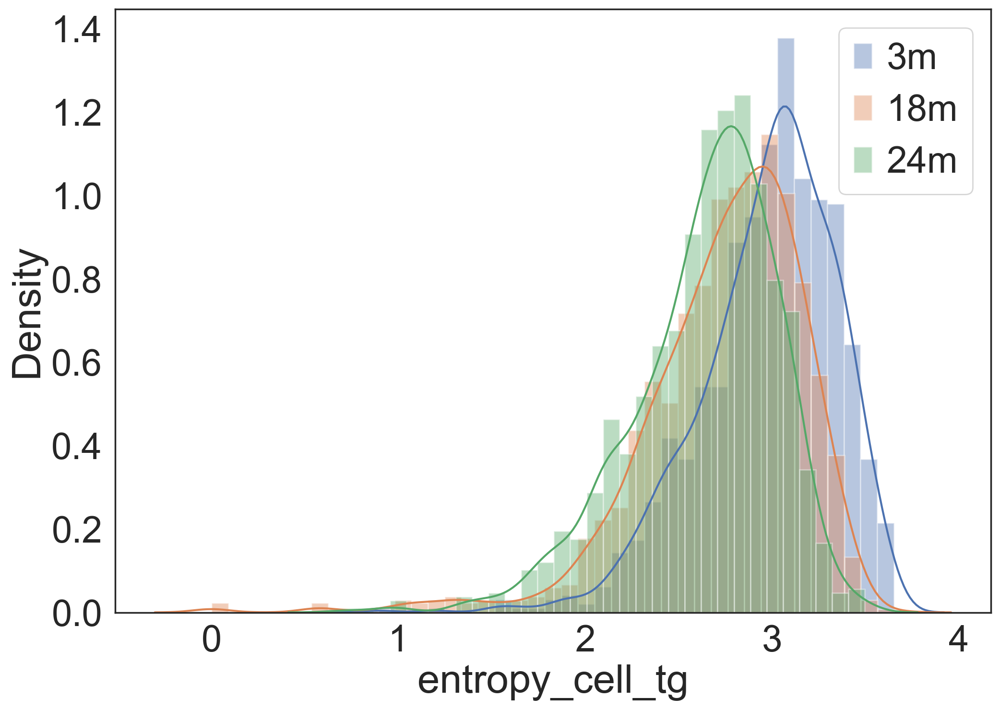

In [440]:
ax=sns.distplot( allcells_df[allcells_df['age']=='3m']['entropy_cell_tg'], label='3m')
ax=sns.distplot( allcells_df[allcells_df['age']=='18m']['entropy_cell_tg'], label='18m')
ax=sns.distplot( allcells_df[allcells_df['age']=='24m']['entropy_cell_tg'], label='24m')
ax.legend()

In [195]:
allcells_df.to_csv('df_results_per_cell_fig1.csv')

# Everything below this is not in figure

# Entropy and MI - relationship understanding 3 May (NOT IN FIGURE)

In [85]:
from scipy.stats import entropy
from math import log, e

In [86]:
ent3=[]
ent18=[]
ent24=[]

for i in age3m_df:
    pd_series = pd.Series(age3m_df[i])
    #print(pd_series)
    #counts = pd_series.value_counts()
    #print(counts)
    print(pd_series)
    ent3.append(entropy(pd_series))
    

for i in age18m_df:
    pd_series = pd.Series(age18m_df[i])
    ent18.append(entropy(pd_series))
    
for i in age24m_df:
    pd_series = pd.Series(age24m_df[i])
    ent24.append(entropy(pd_series))
       

A1.B002765.3_38_F.1.1-1-1     1.761104
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    1.564775
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.044685
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: 0610007C21Rik, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     1.541098
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      1.788955
A10.B002765.3_38_F.1.1-1-1    3.050026
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.070351
P9.D042186.3_8_M.1.1-1-1      1.093036
P9.D042473.3_10_M.1.1-1-1     2.761874
Name: 0610007L01Rik, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D0421

A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: 2300009A05Rik, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     1.565431
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: 2310001A20Rik, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.

Name: 4933407C03Rik, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.010479
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: 4933407H18Rik, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.949316
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: 4933408B17Rik, Length: 1102, dtype: 

Name: Abi3bp, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.023218
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Abl1, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.103199
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.092282
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Abl2, Length: 1102, dtype: float64
A1.B002765.3_38_F

A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Aim2, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     3.411789
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.519505
A10.B002769.3_39_F.1.1-1-1    1.667360
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.111510
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.179776
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Aimp1, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.0000

A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Apobr, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Apoc1, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.

Name: Atg4b, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Atg4d, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.021564
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Atg5, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.0

A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Bbs5, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      6.386443
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Bbs7, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1      0.000000
A1.D042103.3_11_M.1-1-1        0.000000
A1.D042186.3_8_M.1.1-1-1       2.46

A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     8.354696
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: C430049B03Rik, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       3.973293
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: C4b, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_

A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.292568
P9.B002769.3_39_F.1.1-1-1     4.143795
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Ccdc90a, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    4.641806
A10.B002769.3_39_F.1.1-1-1    2.846665
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Ccdc90b, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-

A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Cenpw, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.902008
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     4.860656
P9.D042186.3_8_M.1.1-1-1      0.082568
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Cep110, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.00

Name: Cndp2, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     1.176914
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      2.289206
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    2.070354
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Cnih, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    1.809015
A10.B002769.3_39_F.1.1-1-1    0.797690
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      1.125977
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Cnih4, Length: 1102, dtype: float64
A1.B002765.3_38_F

A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.066920
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.589872
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.125665
P9.B002769.3_39_F.1.1-1-1     0.227910
P9.D042186.3_8_M.1.1-1-1      1.145919
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Csnk1g3, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.050652
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.299060
A10.B002765.3_38_F.1.1-1-1    0.518451
A10.B002769.3_39_F.1.1-1-1    1.010369
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.309973
P9.B002765.3_38_F.1.1-1-1     0.015495
P9.B002769.3_39_F.1.1-1-1     0.533550
P9.D042186.3_8_M.1.1-1-1      1.174999
P9.D042473.3_10_M.1.1-1-1     0.455135
Name: Csnk2a1, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-

Name: Dapp1, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Darc, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.124308
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.198036
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.012957
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     4.706892
Name: Dars, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.00

Name: Dnaja4, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.006558
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.004762
                                ...   
P8.D042473.3_10_M.1.1-1-1     3.359698
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.015699
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Dnajb1, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     3.080366
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      1.943558
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.581236
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     1.436024
P9.B002769.3_39_F.1.1-1-1     0.059358
P9.D042186.3_8_M.1.1-1-1      3.837343
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Dnajb11, Length: 1102, dtype: float64
A1.B002765.3

Name: Edc4, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.047874
A10.B002765.3_38_F.1.1-1-1    0.028488
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     2.679142
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.819737
Name: Edem1, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Edem2, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D

Name: Epn1, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Epn2, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Eppk1, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.581124
A10.B002765

Name: Fam36a, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      2.780344
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.322436
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Fam38a, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Fam38b, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0


A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Flad1, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.211642
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      4.237644
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Flcn, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.0000

Name: Gfer, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     1.420617
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Gfm1, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.092532
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     2.267697
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Gfm2, Length: 1102, dtype: float64
A1.B002765.3_38_F.1

Name: Gng4, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     1.326125
A1.D042103.3_11_M.1-1-1       2.741081
A1.D042186.3_8_M.1.1-1-1      0.711955
A10.B002765.3_38_F.1.1-1-1    1.507418
A10.B002769.3_39_F.1.1-1-1    0.066476
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.759805
P9.B002769.3_39_F.1.1-1-1     0.272438
P9.D042186.3_8_M.1.1-1-1      1.461635
P9.D042473.3_10_M.1.1-1-1     0.576958
Name: Gng5, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Gngt2, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     3.792773
A1.D042103.3_11_M.1-1-1       0.00

Name: H2-M3, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.00000
A1.D042103.3_11_M.1-1-1       0.00000
A1.D042186.3_8_M.1.1-1-1      0.00000
A10.B002765.3_38_F.1.1-1-1    0.00000
A10.B002769.3_39_F.1.1-1-1    0.01031
                               ...   
P8.D042473.3_10_M.1.1-1-1     0.00000
P9.B002765.3_38_F.1.1-1-1     0.00000
P9.B002769.3_39_F.1.1-1-1     0.00000
P9.D042186.3_8_M.1.1-1-1      0.00000
P9.D042473.3_10_M.1.1-1-1     0.00000
Name: H2-Oa, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     6.962299
P9.B002765.3_38_F.1.1-1-1     2.454552
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      5.278031
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: H2-Ob, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1  

Name: Hoxc10, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Hoxc11, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Hoxc6, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1

Name: Imp4, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.756653
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Impa1, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     1.270007
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Impa2, Length: 1102, dtype: float64
A1.B002765.3_38_F

Name: Kdm4b, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.183985
P9.B002765.3_38_F.1.1-1-1     0.808543
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Kdm4c, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.236474
A10.B002765.3_38_F.1.1-1-1    0.013445
A10.B002769.3_39_F.1.1-1-1    1.265365
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     2.976772
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Kdm5a, Length: 1102, dtype: float64
A1.B002765.3_38_

Name: Lilrb4, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       2.684890
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.138266
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Lima1, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.081031
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Limch1, Length: 1102, dtype: float64
A1.B002765.3_3

A1.B002765.3_38_F.1.1-1-1     2.962891
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      1.572136
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    2.500782
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     1.567326
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      2.135349
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Map2k2, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     1.576152
A1.D042103.3_11_M.1-1-1       2.828139
A1.D042186.3_8_M.1.1-1-1      2.478529
A10.B002765.3_38_F.1.1-1-1    2.564088
A10.B002769.3_39_F.1.1-1-1    2.194573
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     3.231534
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Map2k3, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M

A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    1.955922
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     3.233435
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Mfsd5, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.155301
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Mfsd6, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1

A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Mrps35, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.628676
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    1.000791
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Mrps36, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.0

Name: Nbn, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.631765
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Nbr1, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Ncald, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       2.392

A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Npm3-ps1, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    1.992324
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Nppc, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B0027

A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      4.831105
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: P2ry1, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1      0.000000
A1.D042103.3_11_M.1-1-1        0.000000
A1.D042186.3_8_M.1.1-1-1       0.000000
A10.B002765.3_38_F.1.1-1-1     0.000000
A10.B002769.3_39_F.1.1-1-1     0.000000
                                ...    
P8.D042473.3_10_M.1.1-1-1      0.000000
P9.B002765.3_38_F.1.1-1-1      4.873228
P9.B002769.3_39_F.1.1-1-1      0.000000
P9.D042186.3_8_M.1.1-1-1      10.000000
P9.D042473.3_10_M.1.1-1-1      5.502764
Name: P2ry10, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042

A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Pelo, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      2.791407
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Pelp1, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.

Name: Plekhh2, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.058721
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Plekhh3, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     1.752336
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    1.311497
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.738386
P9.B002769.3_39_F.1.1-1-1     3.234085
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     2.876405
Name: Plekhj1, Length: 1102, dtype: float64
A1.B002765

A1.B002765.3_38_F.1.1-1-1     1.604711
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.007499
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     6.123887
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     4.559554
Name: Ppt1, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Ppt2, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.16458

A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Ptpn14, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     3.212415
P9.B002769.3_39_F.1.1-1-1     4.564574
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     4.403102
Name: Ptpn18, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       2.872522
A1.D042186.3_8_M.1.1-1-1      1.4

A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     6.876021
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Rassf5, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Rassf7, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B0027

A1.B002765.3_38_F.1.1-1-1     0.00000
A1.D042103.3_11_M.1-1-1       0.00000
A1.D042186.3_8_M.1.1-1-1      0.00000
A10.B002765.3_38_F.1.1-1-1    1.83664
A10.B002769.3_39_F.1.1-1-1    0.00000
                               ...   
P8.D042473.3_10_M.1.1-1-1     0.00000
P9.B002765.3_38_F.1.1-1-1     0.00000
P9.B002769.3_39_F.1.1-1-1     0.00000
P9.D042186.3_8_M.1.1-1-1      0.00000
P9.D042473.3_10_M.1.1-1-1     0.00000
Name: Rnf214, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Rnf215, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B

A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Sap30, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.197024
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     4.152953
P9.B002765.3_38_F.1.1-1-1     2.318983
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Sap30bp, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      1.4

Name: Sgca, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      2.512880
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    2.167546
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Sgcb, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.263568
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Sgce, Length: 1102, dtype: float64
A1.B002765.3_38_F.1

Name: Slc39a10, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Slc39a11, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Slc39a13, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.462429
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      2.108058


A1.B002765.3_38_F.1.1-1-1     0.692518
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Spata2, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Spata24, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.

A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Supt7l, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1      0.000000
A1.D042103.3_11_M.1-1-1        0.000000
A1.D042186.3_8_M.1.1-1-1       0.000000
A10.B002765.3_38_F.1.1-1-1     0.000000
A10.B002769.3_39_F.1.1-1-1     1.987624
                                ...    
P8.D042473.3_10_M.1.1-1-1      0.000000
P9.B002765.3_38_F.1.1-1-1      0.000000
P9.B002769.3_39_F.1.1-1-1      6.520141
P9.D042186.3_8_M.1.1-1-1      10.000000
P9.D042473.3_10_M.1.1-1-1      0.000000
Name: Supv3l1, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0

A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.011833
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Thbd, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.00000
A1.D042103.3_11_M.1-1-1       0.00000
A1.D042186.3_8_M.1.1-1-1      0.00000
A10.B002765.3_38_F.1.1-1-1    0.82683
A10.B002769.3_39_F.1.1-1-1    0.00000
                               ...   
P8.D042473.3_10_M.1.1-1-1     0.00000
P9.B002765.3_38_F.1.1-1-1     0.00000
P9.B002769.3_39_F.1.1-1-1     0.00000
P9.D042186.3_8_M.1.1-1-1      0.00000
P9.D042473.3_10_M.1.1-1-1     0.00000
Name: Thbs1, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.313261
A1.D042103.3_11_M.1-1-1       0

A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Tmem98, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      2.991639
P9.D042473.3_10_M.1.1-1-1     3.619968
Name: Tmem9b, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.785176
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.0

A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     1.960883
P9.B002765.3_38_F.1.1-1-1     0.991641
P9.B002769.3_39_F.1.1-1-1     1.909007
P9.D042186.3_8_M.1.1-1-1      1.421790
P9.D042473.3_10_M.1.1-1-1     2.592361
Name: Tspan13, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1       0.0
A1.D042186.3_8_M.1.1-1-1      0.0
A10.B002765.3_38_F.1.1-1-1    0.0
A10.B002769.3_39_F.1.1-1-1    0.0
                             ... 
P8.D042473.3_10_M.1.1-1-1     0.0
P9.B002765.3_38_F.1.1-1-1     0.0
P9.B002769.3_39_F.1.1-1-1     0.0
P9.D042186.3_8_M.1.1-1-1      0.0
P9.D042473.3_10_M.1.1-1-1     0.0
Name: Tspan14, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0

A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.168067
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Ubr7, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.330378
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Ubtd1, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.0
A1.D042103.3_11_M.1-1-1  

Name: Wdr44, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     4.221271
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Wdr45, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     2.541537
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.112063
A10.B002765.3_38_F.1.1-1-1    2.000893
A10.B002769.3_39_F.1.1-1-1    3.428745
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     1.326141
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Wdr45l, Length: 1102, dtype: float64
A1.B002765.3_38

A1.B002765.3_38_F.1.1-1-1     0.029560
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      2.062187
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    3.251288
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     0.000000
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     0.000000
Name: Zfp281, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.000000
A1.D042103.3_11_M.1-1-1       0.000000
A1.D042186.3_8_M.1.1-1-1      0.000000
A10.B002765.3_38_F.1.1-1-1    0.000000
A10.B002769.3_39_F.1.1-1-1    0.000000
                                ...   
P8.D042473.3_10_M.1.1-1-1     0.000000
P9.B002765.3_38_F.1.1-1-1     0.000000
P9.B002769.3_39_F.1.1-1-1     7.130238
P9.D042186.3_8_M.1.1-1-1      0.000000
P9.D042473.3_10_M.1.1-1-1     2.944199
Name: Zfp292, Length: 1102, dtype: float64
A1.B002765.3_38_F.1.1-1-1     0.017626
A1.D042103.3_11_M

TypeError: can't multiply sequence by non-int of type 'float'

In [ ]:
def entropy(samples):
        n_samples = len(samples)
        entropy = 0.

        for count in np.bincount(samples):
            p = 1. * count / n_samples
            if p > 0:
                entropy -= p * np.log2(p)

        return entropy
#entropy(pd_series)

# Mutual information function - behind the scenes


# MI Function FROM SKLEARN is correct 

# (not in figure) 
13 May

In [87]:
from sklearn.metrics import normalized_mutual_info_score

def calc_normMI(x, y):
    mi = normalized_mutual_info_score(x,y)
    return mi

In [88]:
mi1=[]
mi3=[]
mi18=[]
mi21=[]
mi24=[]
mi30=[]
count=0
index=[]

for i,j in unique_dict.items():
    #print(type(i))
    try:

        mi3.append(calc_normMI(list(age3m_df[i]),list(age3m_df[j])))
        mi18.append(calc_normMI(list(age18m_df[i]),list(age18m_df[j])))
        mi24.append(calc_normMI(list(age24m_df[i]),list(age24m_df[j])))
        index.append(i+' and '+j)
    
    except KeyError:
        count=count+1
        pass

In [89]:
#nmi_df=pd.DataFrame({'3m':np.array(mi3)/int(age3m_df.shape[0]),'18m':np.array(mi18)/(age18m_df.shape[0]),'24m':np.array(mi24)/(age24m_df.shape[0])})
nmi_df=pd.DataFrame({'3m':np.array(mi3),'18m':np.array(mi18),'24m':np.array(mi24)})
nmi_df.index=index

Text(0.5, 1.0, 'All cells all gene pairs')

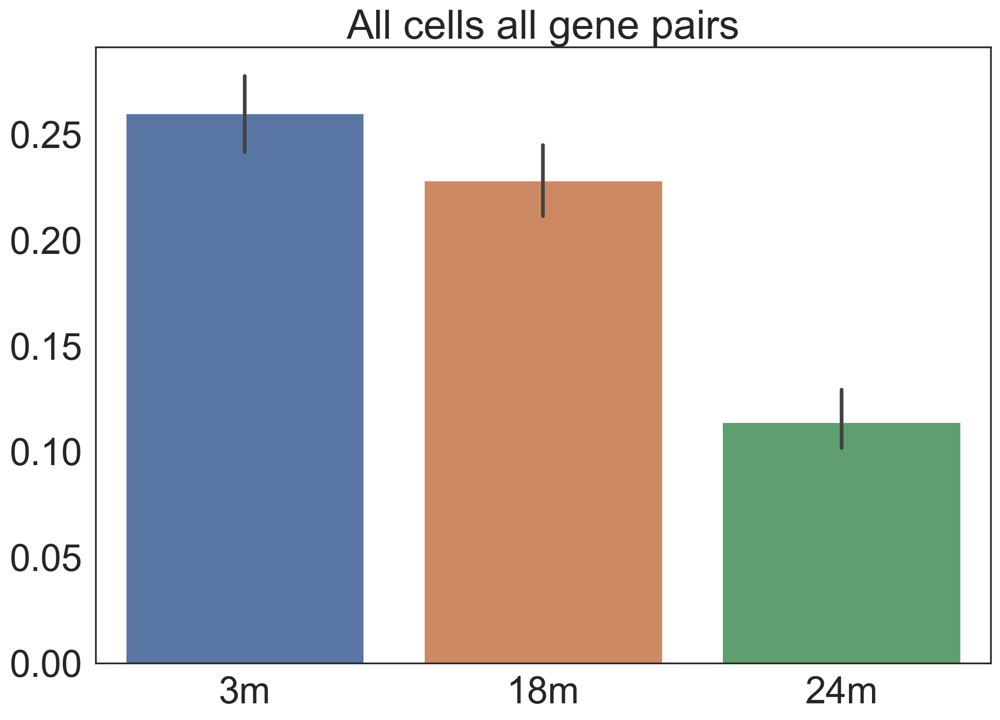

In [90]:
ax = sns.barplot( data=nmi_df)
ax.set_title('All cells all gene pairs')

In [91]:
sns.set(rc={'figure.figsize':(11.7,8.27)})

C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a fi

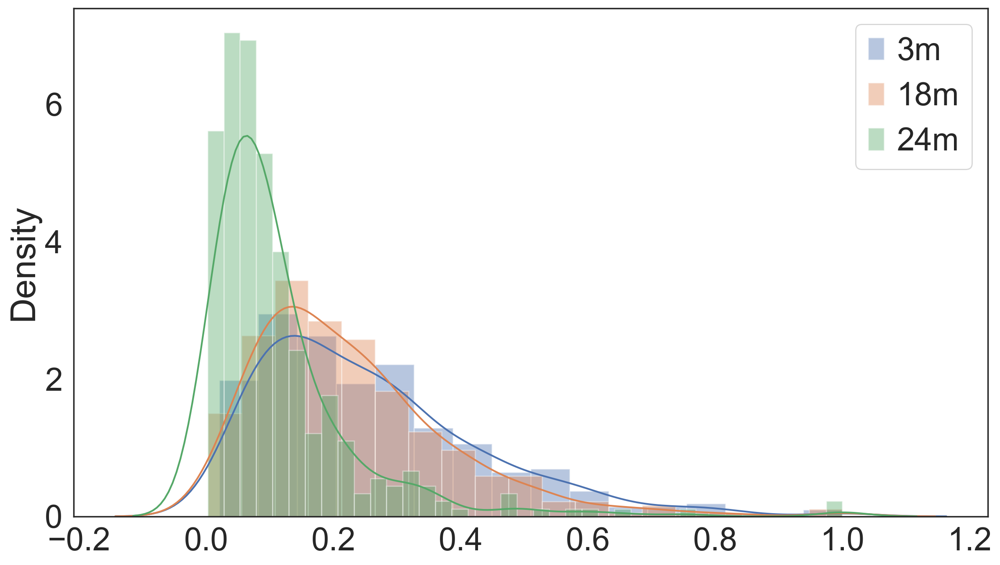

In [92]:
sns.set(font_scale = 2.5)
sns.set_style("white")
#plt.rcParams['patch.edgecolor'] = 'none'
plt.figure(figsize=(14, 8))
plt.rcParams.update({'font.size': 22,'font.family':'sans-serif'})

ax=sns.distplot( nmi_df['3m'], label='3m')
ax=sns.distplot( nmi_df['18m'], label='18m')
ax=sns.distplot( nmi_df['24m'], label='24m')
ax.set(xlabel=None)
ax.legend()

Marginal entropy, conditional entropy and joint entropy
https://stackoverflow.com/questions/15450192/fastest-way-to-compute-entropy-in-python

In [37]:
mi3_tf=[]
mi18_tf=[]
mi24_tf=[]
mi3_tg=[]
mi18_tg=[]
mi24_tg=[]
mi3_j=[]
mi18_j=[]
mi24_j=[]
count=0
index=[]

for i,j in unique_dict.items():
    #print((i))
    try:
        mi3_tf.append(entropy2(list(age3m_df[i])))
        mi3_tg.append(entropy2(list(age3m_df[j])))
        mi18_tf.append(entropy2(list(age18m_df[i])))
        mi18_tg.append(entropy2(list(age18m_df[j])))
        mi24_tf.append(entropy2(list(age24m_df[i])))
        mi24_tg.append(entropy2(list(age24m_df[j])))
                      
        index.append(i+' and '+j)
    
    except KeyError:
        count=count+1
        pass

Aatf
Abl1
Aebp2
Aes
Ahr
Aire
Alx4
Ankrd1
Apbb1
Apc
Apex1
Ar
Arid3a
Arid3b
Arid5b
Arl6ip5
Arnt
Arntl
Arntl2
Arx
Ascl1
Ash1l
Asxl1
Atf1
Atf2
Atf3
Atf4
Atf6
Atm
Atoh1
Bach1
Bach2
Barx2
Batf2
Batf3
Bcl11a
Bcl11b
Bcl3
Bcl6
Bcl6b
Bhlhe40
Bmi1
Bmp4
Bmp6
Brca1
Brca2
Btg2
Bub3
Cbfa2t3
Cbx6
Ccnd1
Cd7
Cdx1
Cdx2
Cdx4
Cebpa
Cebpb
Cebpe
Cebpg
Cebpz
Chd1
Chd4
Chd7
Chd8
Ciita
Cited2
Clock
Cnot3
Cnot7
Cops5
Creb1
Creb3
Creb3l1
Creb3l3
Creb3l4
Crebbp
Crebzf
Crem
Crtc1
Crx
Cry1
Csf1
Csf2
Ctcf
Ctcfl
Ctf1
Ctnnb1
Ctr9
Cux1
Cux2
Dab2
Dach1
Dach2
Daxx
Dbp
Ddit3
Ddx5
Ddx54
Ddx58
Deaf1
Dlx1
Dlx2
Dlx3
Dlx5
Dmap1
Dmbx1
Dmp1
Dmrt1
Dmrt2
Dmtf1
Dnajc2
Dnmt1
Dnmt3a
Dnmt3b
Dot1l
Dtx1
E2f1
E2f2
E2f3
E2f4
E2f5
E2f8
E4f1
Ebf1
Edn1
Egr1
Egr2
Egr3
Egr4
Ehf
Ehmt1
Ehmt2
Eif2ak2
Elf1
Elf2
Elf3
Elf4
Elf5
Elk1
Elk3
Ell3
Elp2
Elp3
Emx2
En1
En2
Eomes
Ep300
Epas1
Epc1
Epo
Epor
Erf
Erg
Esr1
Esr2
Esrra
Esrrb
Esrrg
Ets1
Ets2
Etv1
Etv2
Etv4
Etv5
Etv6
Ewsr1
Eya1
Eya2
Ezh1
Ezh2
Fhl2
Fli1
Fmr1
Fos
Fosb
Fosl1
Fosl2
Foxa1
Foxa2
Foxa3
Foxc1

In [67]:
count

472

In [38]:
enttf_df=pd.DataFrame({'3mtf':np.array(mi3_tf),'18mtf':np.array(mi18_tf),'24mtf':np.array(mi24_tf)})
enttg_df=pd.DataFrame({'3mtg':np.array(mi3_tg),'18mtg':np.array(mi18_tg),'24mtg':np.array(mi24_tg)})


ValueError: arrays must all be same length

In [63]:
print(len((mi3_tg) +  (mi18_tg) +  (mi24_tg)   ))


print(len((mi3_tf) +  (mi18_tf) +  (mi24_tf)   ))

1065
1270


In [70]:

# df = pd.DataFrame(zip(['3mtf']*len(np.array(mi3_tf)), np.array(mi3_tf)),columns =['age_tf','mi_tf'])

# df= df.append(pd.DataFrame(zip(['18mtf']*len(np.array(mi18_tf)), np.array(mi18_tf)),columns =['age_tf','mi_tf']))

# df= df.append(pd.DataFrame(zip(['24mtf']*len(np.array(mi24_tf)), np.array(mi24_tf)),columns =['age_tf','mi_tf']))

tfdf=pd.DataFrame((['3mtf']*len(np.array(mi3_tf))+['18mtf']*len(np.array(mi18_tf))+['24mtf']*len(np.array(mi24_tf))),columns=['age_tf'])
#tfdf['age_tf']=(['3mtf']*len(np.array(mi3_tf))+['18mtf']*len(np.array(mi18_tf))+['24mtf']*len(np.array(mi24_tf)))
tfdf['mi_tf']= (mi3_tf) +  (mi18_tf) +  (mi24_tf)    

tgdf=pd.DataFrame((['3mtg']*len(np.array(mi3_tg))+['18mtg']*len(np.array(mi18_tg))+['24mtg']*len(np.array(mi24_tg))), columns=['age_tg'])
#tgdf['age_tg']=(['3mtg']*len(np.array(mi3_tg))+['18mtg']*len(np.array(mi18_tg))+['24mtg']*len(np.array(mi24_tg)))
tgdf['mi_tg']= (mi3_tg) +  (mi18_tg) +  (mi24_tg)    


In [71]:
tfdf

,age_tf,mi_tf
0,3mtf,1.015659
1,3mtf,1.243642
2,3mtf,2.193989
3,3mtf,4.523079
4,3mtf,1.186738
...,...,...
1265,24mtf,0.168152
1266,24mtf,0.089492
1267,24mtf,0.203908
1268,24mtf,0.076862


C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a fi

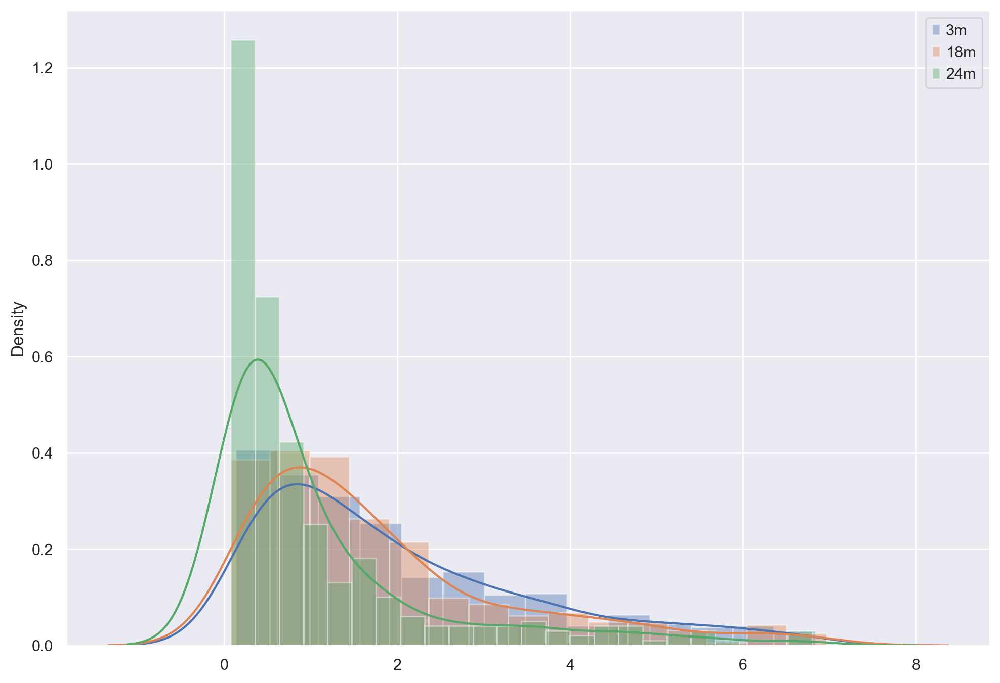

In [45]:
# this is entropy for tfs

ax=sns.distplot( np.array(mi3_tf), label='3m')
ax=sns.distplot( np.array(mi18_tf), label='18m')
ax=sns.distplot( np.array(mi24_tf), label='24m')
ax.legend()

C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a fi

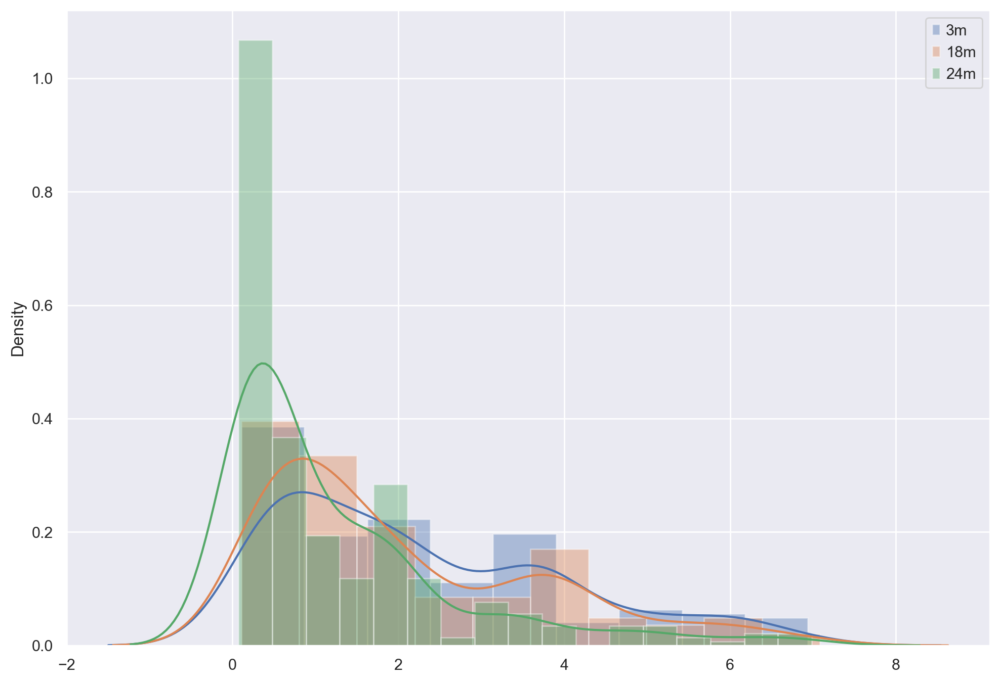

In [46]:
#this is entropy for tgs

ax=sns.distplot( np.array(mi3_tg), label='3m')
ax=sns.distplot( np.array(mi18_tg), label='18m')
ax=sns.distplot( np.array(mi24_tg), label='24m')
ax.legend()

C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a fi

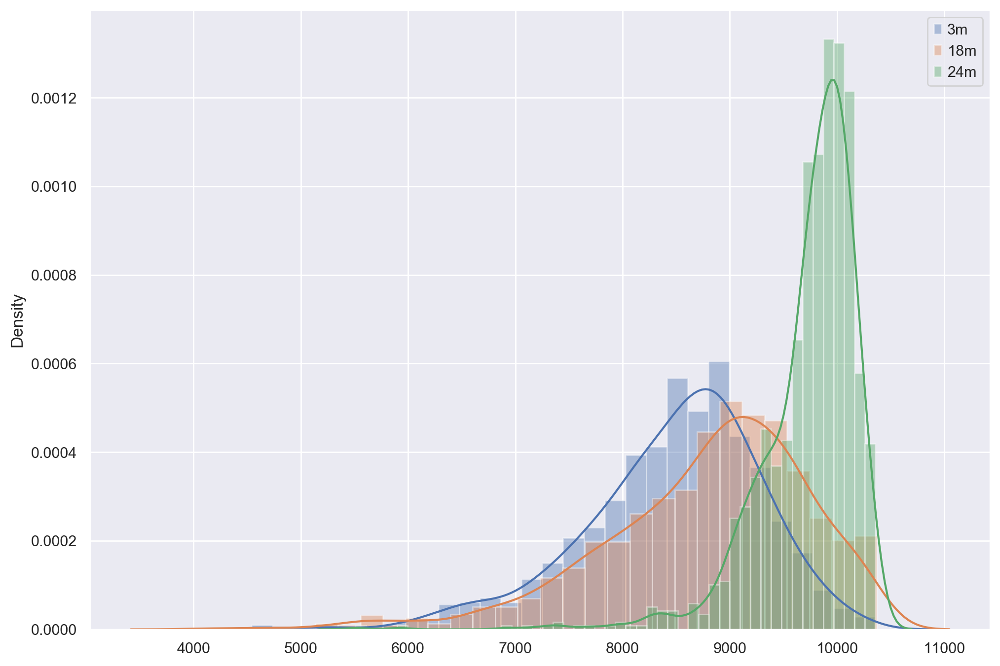

In [58]:
#entropy is tending to zero, because a larger proportion of genes have 0 expresssion- GAG genes TMS data paper

ax=sns.distplot( (age3m_df == 0).sum(axis=1), label='3m')
ax=sns.distplot( (age18m_df == 0).sum(axis=1), label='18m')
ax=sns.distplot( (age24m_df == 0).sum(axis=1), label='24m')
ax.legend()

In [57]:
(age3m_df == 0).sum(axis=1)

3m    8732
3m    9696
3m    8152
3m    8548
3m    7398
      ... 
3m    9189
3m    8186
3m    9334
3m    8706
3m    9189
Length: 1102, dtype: int64

# Comparing entropy, MI, and conditional entropy across age groups - TF, TG
# per animal ( not in figure)

In [ ]:
# USED FOR ALL CELLS ENTROPY IN FIG 1D

# #NEW_ANIMALS_DF is mean gene counts for each animal

# ent_mean_animal=[]
# for index, animal in new_animals_df.iterrows():    
#     age_cut=pd.cut(animal, bins=2**np.linspace(0, 15, 500)).sort_index()
#     counts=age_cut.value_counts()
#     cnt=counts/len(counts)
#     ent_mean_animal.append(entropy(cnt))

In [93]:
len(unique_dict)

827

In [94]:
len(set(list(age3m_df.columns))& set(list(unique_dict.keys())))

560

In [95]:
tf_in_genes=(np.unique(list(set(list(age3m_df.columns))& set(list(unique_dict.keys())))))

In [96]:
tg_in_genes=(np.unique(list(set(list(age3m_df.columns))& set(list(unique_dict.values())))))

In [97]:
print(tf_in_genes)

['Aatf' 'Abl1' 'Aebp2' 'Aes' 'Ahr' 'Ankrd1' 'Apbb1' 'Apc' 'Apex1' 'Ar'
 'Arid3b' 'Arid5b' 'Arl6ip5' 'Arnt' 'Arntl' 'Ash1l' 'Asxl1' 'Atf1' 'Atf2'
 'Atf3' 'Atf4' 'Atf6' 'Atm' 'Bach1' 'Bach2' 'Batf3' 'Bcl11b' 'Bcl3' 'Bcl6'
 'Bcl6b' 'Bhlhe40' 'Bmi1' 'Bmp4' 'Bmp6' 'Brca2' 'Btg2' 'Bub3' 'Cbfa2t3'
 'Cbx6' 'Ccnd1' 'Cd7' 'Cebpa' 'Cebpb' 'Cebpg' 'Cebpz' 'Chd1' 'Chd4' 'Chd7'
 'Chd8' 'Cited2' 'Clock' 'Cnot3' 'Cnot7' 'Cops5' 'Creb1' 'Creb3' 'Creb3l1'
 'Crebbp' 'Crebzf' 'Crem' 'Crtc1' 'Cry1' 'Csf1' 'Ctcf' 'Ctf1' 'Ctnnb1'
 'Ctr9' 'Cux1' 'Dab2' 'Dach1' 'Daxx' 'Dbp' 'Ddit3' 'Ddx5' 'Ddx54' 'Ddx58'
 'Deaf1' 'Dmap1' 'Dmrt2' 'Dmtf1' 'Dnajc2' 'Dnmt1' 'Dnmt3a' 'Dot1l' 'E2f1'
 'E2f2' 'E2f3' 'E2f4' 'E2f5' 'E4f1' 'Ebf1' 'Edn1' 'Egr1' 'Egr2' 'Ehmt1'
 'Ehmt2' 'Eif2ak2' 'Elf1' 'Elf2' 'Elf4' 'Elk1' 'Elk3' 'Elp2' 'Elp3' 'Emx2'
 'En1' 'Ep300' 'Epas1' 'Epc1' 'Erf' 'Esr1' 'Esrra' 'Ets1' 'Ets2' 'Etv1'
 'Etv5' 'Etv6' 'Ewsr1' 'Eya1' 'Eya2' 'Ezh1' 'Ezh2' 'Fhl2' 'Fli1' 'Fmr1'
 'Fos' 'Fosb' 'Fosl1' 'Fosl2' 'Foxc1' 'Foxj3' 'F

In [98]:
tf_i=[]
tg_j=[]
count=0

for i,j in unique_dict.items():
    #print(i)
    try:
        if (i in list(new_animals_df.columns)) and (j in list(new_animals_df.columns)):
            tf_i.append(i)
            tg_j.append(j)
    except:
        count+=1

present_tf_tg_dict=dict(zip(tf_i,tg_j))

In [99]:
len(present_tf_tg_dict)

355

In [100]:
#As a function : entropy, MI, Cond entropy calculation:

def animal_entropy(df,tf_in_genes,tg_in_genes):
    
    '''
    df: dataframe with genes as columns, animals as rows
    tf_in_genes: unique tfs in rna seq data
    tg_in_genes: unique tgs in rna seq data
    ''' 
    ent_animal_tf=[]
    ent_animal_tg=[]
    
    for index,animal in df.iterrows():

        animal_tf=pd.cut(animal[tf_in_genes], bins=2**np.linspace(0, 15, 500)).sort_index()
        counts=animal_tf.value_counts()
        cnt=counts/len(counts)
        ent_animal_tf.append(entropy(cnt))
        
        animal_tg=pd.cut(animal[tg_in_genes], bins=2**np.linspace(0, 15, 500)).sort_index()
        counts=animal_tg.value_counts()
        cnt=counts/len(counts)
        ent_animal_tg.append(entropy(cnt))
    
    
    return ent_animal_tf,ent_animal_tg
    
    


In [101]:

def animal_mi(df,present_tf_tg_dict):
    '''
    df: dataframe with genes as columns, animals as rows
    unique_dict: tf-tg pairs as a dict
    ''' 
    mi_animal=[]
    count=0
    
    for index,animal in df.iterrows():
        
        try:
            mi_animal.append(calc_normMI(list(animal[list(present_tf_tg_dict.keys())]),list(animal[list(present_tf_tg_dict.values())])))

        except:
            count+=1
            pass
    
    
    return mi_animal

In [74]:
ent_animal_tf,ent_animal_tg=animal_entropy(new_animals_df,tf_in_genes,tg_in_genes)

In [75]:
mi_animal=animal_mi(new_animals_df,present_tf_tg_dict)

In [76]:
mi_animal

[0.9277826117846012,
 0.9210197091597206,
 0.9274002073640523,
 0.9274002073640523,
 0.9277826117846012,
 0.9277826117846012,
 0.9266345796357149,
 0.9277826117846012,
 0.9277826117846014,
 0.9277826117846012,
 0.9277826117846014,
 0.9259618835127161,
 0.9274002073640523,
 0.9277826117846012]

In [77]:
new_animals_df['entropy_tf']=ent_animal_tf
new_animals_df['entropy_tg']=ent_animal_tg
new_animals_df['mi_animal']=mi_animal
new_animals_df['condi_ent_tf|tg']=new_animals_df['entropy_tf']-new_animals_df['mi_animal']
new_animals_df['condi_ent_tg|tf']=new_animals_df['entropy_tg']-new_animals_df['mi_animal']

In [88]:
new_animals_df

,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610009B22Rik,0610009D07Rik,0610009L18Rik,0610009O20Rik,...,Zzef1,Zzz3,entropy_tf,entropy_tg,mi_animal,condi_ent_tf|tg,condi_ent_tg|tf,age,sex,entropy
animal_id,,,,,,,,,,,,,,,,,,,,,
3_10_M,0.656059,0.597111,0.330949,0.220857,0.312136,0.183908,0.166192,0.629353,0.051472,0.207039,...,0.404277,0.440618,2.538258,2.698231,0.927783,1.610476,1.770449,3m,M,3.521579
3_11_M,0.638704,0.492194,0.442516,0.113218,0.164927,0.161550,0.266114,0.502351,0.001300,0.432754,...,0.321250,0.340637,2.660326,2.689178,0.921020,1.739307,1.768158,3m,M,3.790859
3_38_F,0.560297,0.367929,0.244728,0.108394,0.234330,0.134121,0.155740,0.671374,0.188199,0.164401,...,0.225120,0.204811,2.585055,2.322188,0.927400,1.657655,1.394788,3m,F,3.686698
3_39_F,0.572111,0.417346,0.179087,0.123684,0.216286,0.176632,0.080428,0.727866,0.108687,0.182991,...,0.132296,0.196600,2.598605,2.399204,0.927400,1.671205,1.471804,3m,F,3.626620
3_8_M,0.541668,1.002012,0.248142,0.482507,0.270241,0.189503,0.146052,0.653840,0.098616,0.558448,...,0.427488,0.585852,3.046500,2.965194,0.927783,2.118718,2.037412,3m,M,3.472969
3_9_M,0.472328,0.692019,0.334828,0.242288,0.574010,0.286710,0.138622,0.617331,0.011781,0.240348,...,0.412121,0.866831,2.658530,2.628675,0.927783,1.730748,1.700893,3m,M,3.569872
18_45_M,0.630308,0.189227,0.102306,0.036959,0.389844,0.224170,0.119987,0.620881,0.128233,0.093277,...,0.119250,0.130084,2.302585,2.302585,0.926635,1.375951,1.375951,18m,M,3.652395
18_46_F,0.699150,0.431142,0.246607,0.125119,0.272330,0.223595,0.248439,0.701648,0.213757,0.173779,...,0.210158,0.235413,2.552085,2.523211,0.927783,1.624303,1.595428,18m,F,3.777581
18_47_F,0.594517,0.369912,0.177777,0.230369,0.391237,0.211186,0.271165,0.483794,0.117534,0.240427,...,0.222435,0.118351,2.694154,2.582306,0.927783,1.766371,1.654524,18m,F,3.635916


In [102]:

age_mean_venn=new_animals_df.groupby('age').mean()

In [107]:
age_mean_venn

,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610009B22Rik,0610009D07Rik,0610009L18Rik,0610009O20Rik,...,Zzef1,Zzz3,entropy_tf,entropy_tg,mi_animal,condi_ent_tf|tg,condi_ent_tg|tf,entropy,entropy_nottf,entropy_nottg
age,,,,,,,,,,,,,,,,,,,,,
18m,0.676281,0.372839,0.202035,0.120491,0.329164,0.237466,0.240358,0.622791,0.155909,0.179985,...,0.212578,0.148584,2.475124,2.480190,0.927496,1.547629,1.552695,3.674679,3.671897,3.669612
24m,0.574804,0.292780,0.231485,0.057517,0.166082,0.187273,0.120862,0.530673,0.105528,0.101824,...,0.139459,0.144621,2.477817,2.300844,0.927232,1.550586,1.373612,3.790507,3.786623,3.780332
3m,0.573528,0.594768,0.296708,0.215158,0.295322,0.188737,0.158858,0.633686,0.076676,0.297664,...,0.320425,0.439225,2.681213,2.617112,0.926528,1.754685,1.690584,3.611433,3.611901,3.605034


In [110]:
age_mean_venn['age']=list(age_mean_venn.index.values)

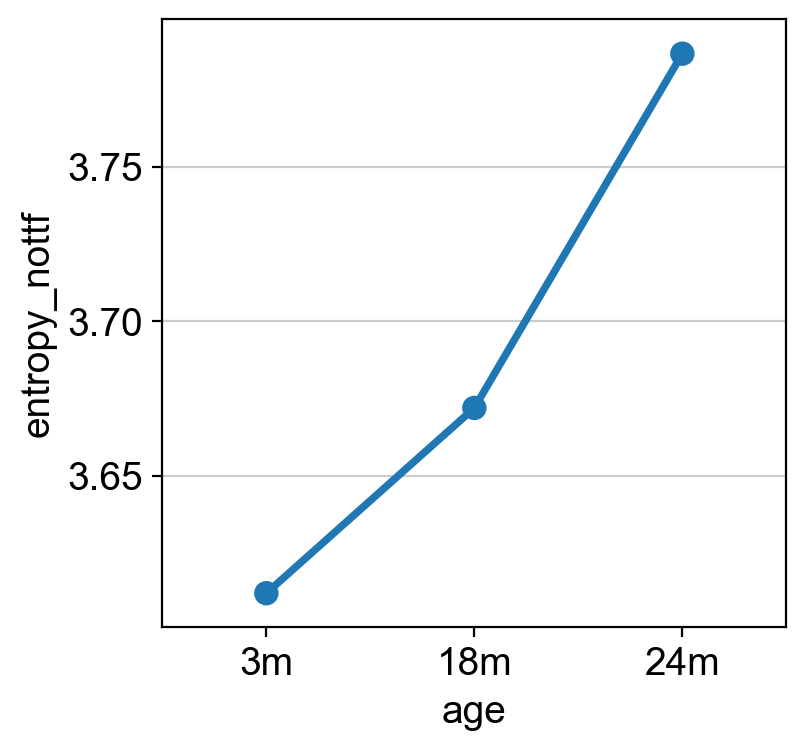

In [113]:
sns.pointplot(data=age_mean_venn, x='age', y='entropy_nottf', order=['3m','18m','24m'])

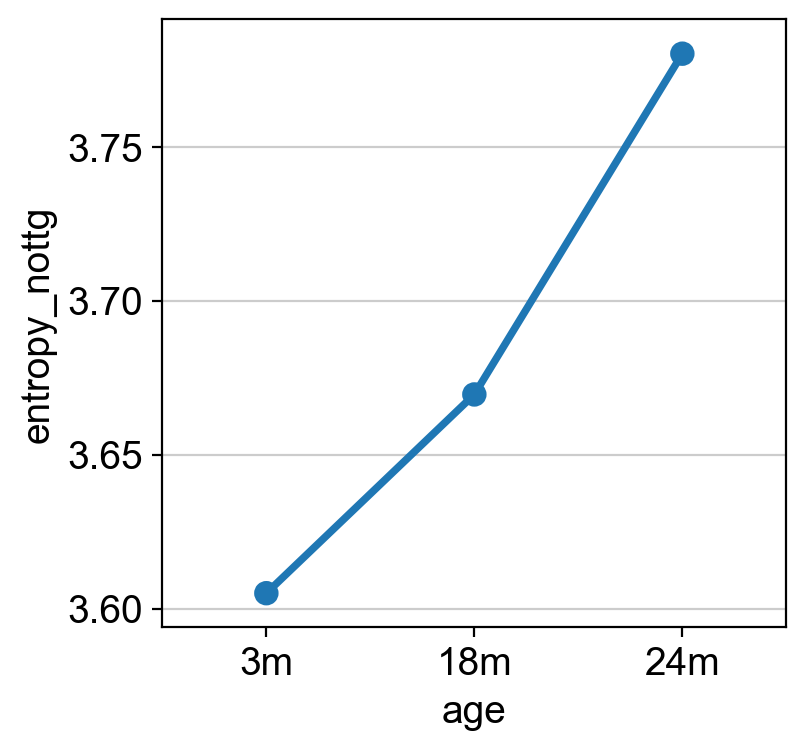

In [112]:
sns.pointplot(data=age_mean_venn, x='age', y='entropy_nottg', order=['3m','18m','24m'])

In [317]:
len(ent_animal_tf)

3360

In [97]:
lst=list(age3m_df.columns)
lst = lst[:len(lst)-4]

In [98]:
# ENTROPY OF GENES THAT ARE NOT REGULATED.

tf_notin_genes=(np.unique(list(set(lst)- set(list(unique_dict.keys())))))
tg_notin_genes=(np.unique(list(set(lst)- set(list(unique_dict.values())))))
  

In [100]:
ent_animal_nottf,ent_animal_nottg=animal_entropy(new_animals_df,tf_notin_genes,tg_notin_genes)

In [101]:
new_animals_df['entropy_nottf']=ent_animal_nottf
new_animals_df['entropy_nottg']=ent_animal_nottg

# TMS Bulk RNA seq entropy

TMS single cell data has 4, 2, 4 MALE animals respectively from FACS data.

In [402]:
tms_bulk_df_t.shape

(54, 54356)

In [403]:
tms_bulk_df_t.head()

gene,0610005C13Rik,0610006L08Rik,0610009B22Rik,0610009E02Rik,0610009L18Rik,0610010F05Rik,0610010K14Rik,0610012D04Rik,0610012G03Rik,0610025J13Rik,...,n-R5s95,n-R5s96,n-R5s97,n-R5s98,n-TSaga9,n-TStga1,sample number,age,sex,entropy
1_age_1_sex_m,9,1,111,9,126,225,9,2,620,1,...,0,0,1,0,0,0,1,1 m,m,2.978820
2_age_1_sex_f,2,0,151,5,164,197,27,3,711,0,...,0,0,0,0,0,0,2,1 m,f,2.983625
3_age_1_sex_m,3,0,237,8,206,536,33,0,980,7,...,1,0,0,0,0,0,3,1 m,m,2.941334
4_age_1_sex_m,4,0,113,3,135,176,20,6,586,0,...,0,0,0,0,0,0,4,1 m,m,3.014035
5_age_1_sex_f,0,0,122,3,89,176,14,3,556,1,...,0,0,0,0,0,0,5,1 m,f,2.457639


In [19]:
# templist= [name.split('/')[1] for name in tms_bulk_df_t.index.values]
# df['sample']= [i.split('.')[0] for i in templist]

tms_bulk_df_t['sample number']= [i.split('_')[0] for i in tms_bulk_df_t.index.values]

tms_bulk_df_t['age']=[i.split('_')[2] for i in tms_bulk_df_t.index.values]

tms_bulk_df_t['sex']=[i.split('_')[4] for i in tms_bulk_df_t.index.values]

In [62]:
tms_bulk_df_t

gene,0610005C13Rik,0610006L08Rik,0610009B22Rik,0610009E02Rik,0610009L18Rik,0610010F05Rik,0610010K14Rik,0610012D04Rik,0610012G03Rik,0610025J13Rik,...,n-R5s94,n-R5s95,n-R5s96,n-R5s97,n-R5s98,n-TSaga9,n-TStga1,sample number,age,sex
1_age_1_sex_m,9,1,111,9,126,225,9,2,620,1,...,0,0,0,1,0,0,0,1,1,m
2_age_1_sex_f,2,0,151,5,164,197,27,3,711,0,...,0,0,0,0,0,0,0,2,1,f
3_age_1_sex_m,3,0,237,8,206,536,33,0,980,7,...,0,1,0,0,0,0,0,3,1,m
4_age_1_sex_m,4,0,113,3,135,176,20,6,586,0,...,0,0,0,0,0,0,0,4,1,m
5_age_1_sex_f,0,0,122,3,89,176,14,3,556,1,...,0,0,0,0,0,0,0,5,1,f
6_age_1_sex_m,0,0,135,0,86,130,21,0,296,3,...,0,0,0,1,0,0,0,6,1,m
7_age_3_sex_m,6,0,209,1,148,259,19,1,635,0,...,0,0,0,2,0,0,0,7,3,m
8_age_3_sex_m,2,0,206,0,174,395,31,0,798,5,...,0,0,0,0,0,0,0,8,3,m
9_age_3_sex_m,1,0,329,5,261,596,47,1,1155,6,...,0,0,0,0,0,0,0,9,3,m
10_age_3_sex_f,7,1,162,3,95,344,12,5,752,3,...,1,0,0,0,0,0,0,10,3,f


In [64]:
tms_bulk_male=tms_bulk_df_t[tms_bulk_df_t['sex']=='m']
#df.sort_values('age',ascending=True)
tms_bulk_male

#df.set_index(['sample number'], inplace=True)
tms_bulk_male['age']=tms_bulk_male['age'].astype(int)
tms_bulk_male=tms_bulk_male.sort_values(by='age')

# df

C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [65]:
tms_bulk_male

gene,0610005C13Rik,0610006L08Rik,0610009B22Rik,0610009E02Rik,0610009L18Rik,0610010F05Rik,0610010K14Rik,0610012D04Rik,0610012G03Rik,0610025J13Rik,...,n-R5s94,n-R5s95,n-R5s96,n-R5s97,n-R5s98,n-TSaga9,n-TStga1,sample number,age,sex
1_age_1_sex_m,9,1,111,9,126,225,9,2,620,1,...,0,0,0,1,0,0,0,1,1,m
3_age_1_sex_m,3,0,237,8,206,536,33,0,980,7,...,0,1,0,0,0,0,0,3,1,m
4_age_1_sex_m,4,0,113,3,135,176,20,6,586,0,...,0,0,0,0,0,0,0,4,1,m
6_age_1_sex_m,0,0,135,0,86,130,21,0,296,3,...,0,0,0,1,0,0,0,6,1,m
7_age_3_sex_m,6,0,209,1,148,259,19,1,635,0,...,0,0,0,2,0,0,0,7,3,m
8_age_3_sex_m,2,0,206,0,174,395,31,0,798,5,...,0,0,0,0,0,0,0,8,3,m
9_age_3_sex_m,1,0,329,5,261,596,47,1,1155,6,...,0,0,0,0,0,0,0,9,3,m
12_age_3_sex_m,6,0,172,3,158,289,17,0,579,1,...,0,0,0,0,0,0,0,12,3,m
13_age_6_sex_m,1,0,187,5,110,312,31,1,761,0,...,0,0,0,0,0,0,0,13,6,m
15_age_6_sex_m,5,5,89,4,62,138,22,1,329,3,...,0,0,0,0,1,0,1,15,6,m


In [105]:
entropy_animal=[]
mydf = tms_bulk_male.iloc[:,:-3]

for number,animal in enumerate(tms_bulk_male['sample number']):
    counts=mydf.iloc[number, :].value_counts()
    cnt=counts/len(counts)
    entropy_animal.append(entropy(cnt))
print(entropy_animal)

[2.9788201601628197, 2.941334037612514, 3.0140350582990365, 2.455052971683343, 2.9040078455221296, 2.8265252672626127, 3.0404575381975056, 2.7071560900086697, 2.652144466095358, 3.1744243792865654, 3.290507354942718, 3.286862361792478, 2.6554263154742075, 2.605433761290091, 2.9987830807284253, 3.188009071416207, 2.8222816976719334, 2.7384174831693184, 3.1611767552833268, 3.3181256832020747, 2.68832437309841, 2.811840515016302, 2.7803193726814373, 2.328025911789875, 3.198867113947831, 3.649952070258447, 2.796819146050566, 1.3050962738387648, 2.815044749583484, 3.255705095242817, 3.353385172162281, 2.6145289366136906, 3.651518283822224, 2.8439703747553815, 3.5429270744583645, 3.600395931760311, 2.9690684182205267, 3.328438188627347]


In [106]:
tms_bulk_male['entropy']=entropy_animal

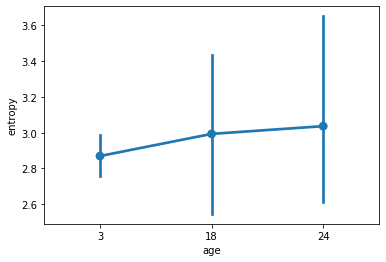

In [107]:
sns.pointplot(data=tms_bulk_male[tms_bulk_male['age'].isin([3,18,24])], x='age',y='entropy')

In [102]:
#tms_bulk_df_t

entropy_animal=[]
mydf = tms_bulk_df_t.iloc[:,:-3]

for number,animal in enumerate(tms_bulk_df_t['sample number']):
    counts=mydf.iloc[number, :].value_counts()
    cnt=counts/len(counts)
    entropy_animal.append(entropy(cnt))
print(entropy_animal)
tms_bulk_df_t['entropy']=entropy_animal

[2.9788201601628197, 2.983624622544939, 2.941334037612514, 3.0140350582990365, 2.457638871518282, 2.455052971683343, 2.9040078455221296, 2.8265252672626127, 3.0404575381975056, 3.723488766375995, 2.639615265098988, 2.7071560900086697, 3.290507354942718, 2.279876001308407, 2.652144466095358, 2.7626366017932926, 3.1744243792865654, 3.286862361792478, 2.6554263154742075, 2.605433761290091, 2.9987830807284253, 3.05275357363421, 3.0076282209056524, 2.8222816976719334, 3.164977879785784, 3.188009071416207, 3.1611767552833268, 2.7384174831693184, 3.0466146584167944, 3.5572853413873924, 3.3181256832020747, 2.68832437309841, 2.811840515016302, 3.211891778748589, 2.7803193726814373, 2.796819146050566, 3.0319518555999663, 3.649952070258447, 3.198867113947831, 2.328025911789875, 2.993864926733379, 2.471317638133017, 3.255705095242817, 3.353385172162281, 2.815044749583484, 3.513965337923641, 1.3050962738387648, 2.8439703747553815, 2.6145289366136906, 3.651518283822224, 2.9690684182205267, 3.5429270

In [406]:
#entropy_bineed as per single cell
#tms_bulk_df_t

entropy_animal=[]
mydf = tms_bulk_df_t.iloc[:,:-4]

ent_mean_bulk_animal=[]

for number,animal in enumerate(tms_bulk_df_t['sample number']):  
    age_cut=pd.cut(mydf.iloc[number, :], bins=2**np.linspace(0, 15, 100)).sort_index()
    counts=age_cut.value_counts()
    cnt=counts/len(counts)
    ent_mean_bulk_animal.append(entropy(cnt))
    
print(ent_mean_bulk_animal)

[3.7828898638559103, 3.823920477256123, 4.069577886584652, 3.7693754867851195, 3.976412183019175, 3.78329310310272, 3.8667049489518206, 3.9861593688911006, 4.088615199230003, 3.7611826272349633, 4.011231362575697, 4.029167653909571, 4.060674005339383, 3.7041761009186773, 3.5709574236757287, 4.037733361260102, 3.65564290200319, 3.6985400588880584, 4.065104562613957, 4.061971092773408, 3.5819634172727817, 3.7779877884907442, 3.8644025480452444, 3.718500632449986, 3.8727606307684637, 3.903818785117043, 3.9291461528808673, 3.9013204528656837, 3.833195982459511, 3.7857729183802, 3.7239833504335653, 3.8691176469142174, 3.9634649305390033, 3.7691431490249934, 4.069982341414187, 3.8208189003848125, 3.7790522360625123, 3.852299039250112, 3.859627806719913, 3.8751976224283715, 3.7292480878811873, 3.766996627457285, 3.8269147213486443, 3.7969220965724895, 4.024055828023459, 3.7563576336780664, 3.2942226470986395, 3.9090231842463954, 3.735395889048422, 3.743075762361319, 3.6585854229558823, 3.9670

In [408]:
tms_bulk_df_t['age']=tms_bulk_df_t['age'].astype(int)
tms_bulk_df_t=tms_bulk_df_t.sort_values(by='age')

tms_bulk_df_t['age']=tms_bulk_df_t['age'].astype(str)+' m'


ValueError: invalid literal for int() with base 10: '1 m'

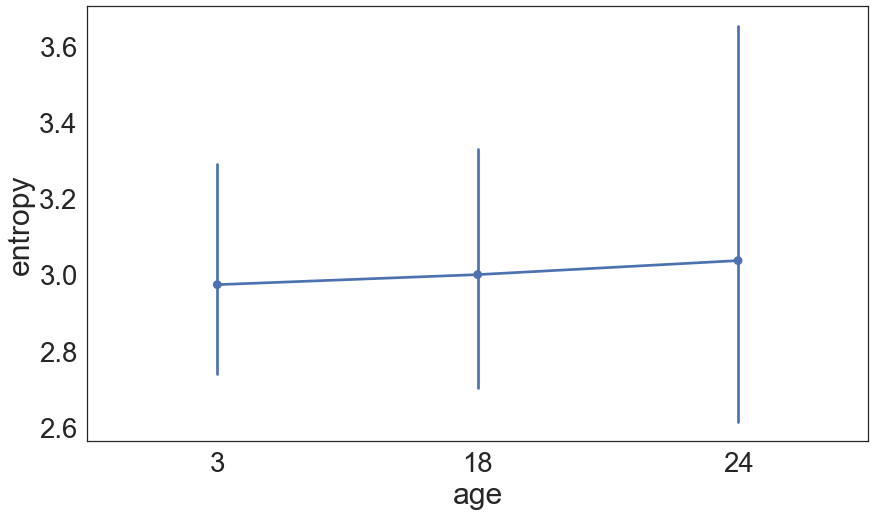

In [202]:
sns.set(font_scale = 2.5)
sns.set_style("white")
#plt.rcParams['patch.edgecolor'] = 'none'
plt.figure(figsize=(14, 8))
plt.rcParams.update({'font.size': 22,'font.family':'sans-serif'})

sns.pointplot(data=tms_bulk_df_t[tms_bulk_df_t['age'].isin([3,18,24])], x='age',y='entropy')

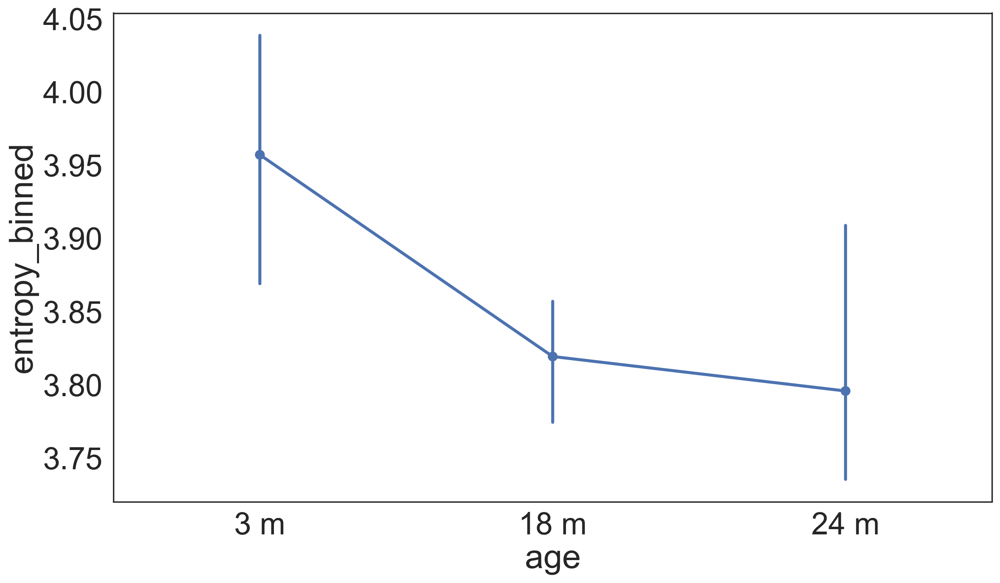

In [410]:
# binned attempt
tms_bulk_df_t['entropy_binned']=ent_mean_bulk_animal

sns.set(font_scale = 2.5)
sns.set_style("white")
#plt.rcParams['patch.edgecolor'] = 'none'
plt.figure(figsize=(14, 8))
plt.rcParams.update({'font.size': 22,'font.family':'sans-serif'})

sns.pointplot(data=tms_bulk_df_t[tms_bulk_df_t['age'].isin(['3 m','18 m','24 m'])], x='age',y='entropy_binned')

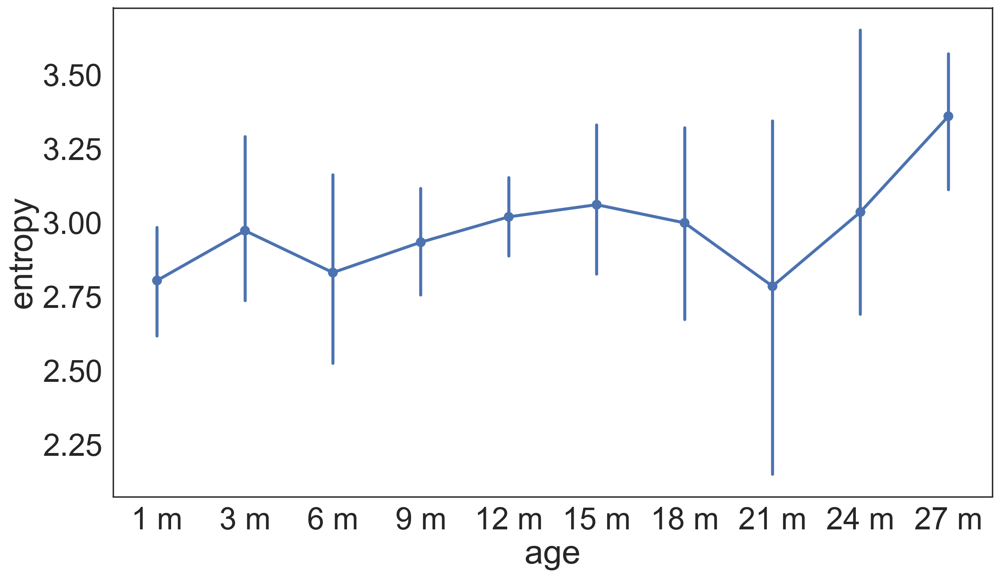

In [411]:
sns.set(font_scale = 2.5)
sns.set_style("white")
#plt.rcParams['patch.edgecolor'] = 'none'
plt.figure(figsize=(14, 8))
plt.rcParams.update({'font.size': 22,'font.family':'sans-serif'})

sns.pointplot(data=tms_bulk_df_t, x='age',y='entropy')

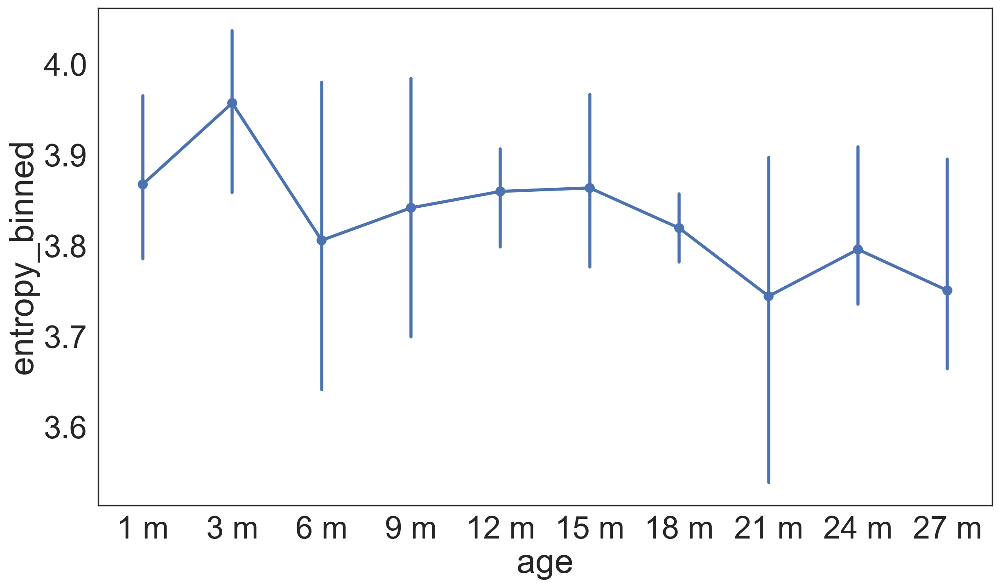

In [412]:
sns.set(font_scale = 2.5)
sns.set_style("white")
#plt.rcParams['patch.edgecolor'] = 'none'
plt.figure(figsize=(14, 8))
plt.rcParams.update({'font.size': 22,'font.family':'sans-serif'})

sns.pointplot(data=tms_bulk_df_t, x='age',y='entropy_binned')

# distribution of mean counts per age group log scaled

In [111]:
tms_bulk_for_mean = tms_bulk_df_t.drop(['sex','sample number','entropy'], axis=1)
tms_bulk_mean= tms_bulk_for_mean.groupby('age').mean()
tms_bulk_mean.head()

gene,0610005C13Rik,0610006L08Rik,0610009B22Rik,0610009E02Rik,0610009L18Rik,0610010F05Rik,0610010K14Rik,0610012D04Rik,0610012G03Rik,0610025J13Rik,...,n-R5s90,n-R5s92,n-R5s93,n-R5s94,n-R5s95,n-R5s96,n-R5s97,n-R5s98,n-TSaga9,n-TStga1
age,,,,,,,,,,,,,,,,,,,,,
1,3.000000,0.166667,144.833333,4.666667,134.333333,240.000000,20.666667,2.333333,624.833333,2.000000,...,0.666667,0.000000,0.000000,0.000000,0.166667,0.0,0.333333,0.000000,0.0,0.0
3,3.666667,0.166667,206.666667,2.666667,151.333333,359.333333,23.333333,1.166667,741.500000,2.500000,...,0.000000,0.000000,0.166667,0.166667,0.000000,0.0,0.333333,0.000000,0.0,0.0
6,3.000000,1.000000,145.800000,3.200000,103.800000,215.600000,19.800000,0.600000,558.800000,2.000000,...,1.000000,0.000000,0.000000,0.000000,0.400000,0.0,0.000000,0.200000,0.0,0.8
9,3.000000,1.000000,160.666667,3.500000,113.166667,251.666667,11.833333,0.500000,577.833333,2.166667,...,0.333333,0.000000,0.000000,0.166667,0.000000,0.0,0.000000,0.333333,0.0,0.0
12,4.000000,1.666667,178.000000,2.500000,136.333333,281.000000,11.000000,2.000000,632.166667,3.000000,...,0.000000,0.166667,0.000000,0.166667,0.000000,0.0,1.000000,0.000000,0.0,0.0


In [128]:
tms_bulk_mean.index.values

array([ 1,  3,  6,  9, 12, 15, 18, 21, 24, 27], dtype=int64)

In [119]:
tms_bulk_mean=tms_bulk_mean.loc[:, (tms_bulk_mean != 0).any(axis=0)]

In [129]:
sub_tms_bulk_mean=tms_bulk_mean.loc[[3,18,24]]

C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sruth\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a fi

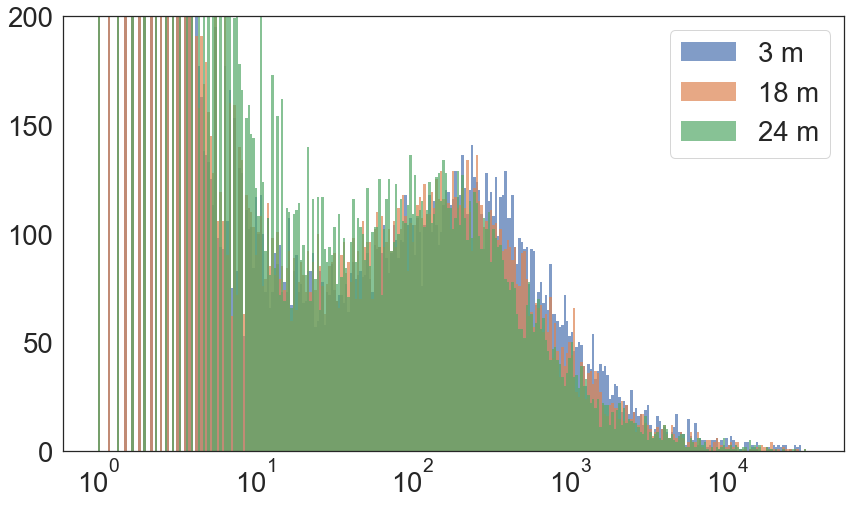

In [167]:
#ax=sns.histplot(data=tms_bulk_mean, x= 'age', y='log_scale=True, color="skyblue",label='3m')
sns.set(font_scale = 2.5)
sns.set_style("white")
plt.rcParams['patch.edgecolor'] = 'none'
plt.figure(figsize=(14, 8))
plt.rcParams.update({'font.size': 22,'font.family':'sans-serif'})
for age in sub_tms_bulk_mean.index.values:
    sns.distplot(sub_tms_bulk_mean.loc[age], label=str(age)+' m',
                 bins=2**np.linspace(0, 15, 300),hist_kws={'alpha':0.7}, 
                 kde=False)
plt.legend()
plt.xscale('log')
plt.xlabel('')
plt.ylim(0,200)
plt.show()

# Stem cells vs non-stem cells entropy

In [101]:
age3m_df['celltype'].unique()

array(['skeletal muscle satellite cell', 'macrophage',
       'mesenchymal stem cell', 'endothelial cell', 'B cell', 'T cell'],
      dtype=object)

In [105]:
age3m_stem = age3m_df[age3m_df['celltype'].isin(['skeletal muscle satellite cell','mesenchymal stem cell'])]
age3m_nonstem = age3m_df[~age3m_df['celltype'].isin(['skeletal muscle satellite cell','mesenchymal stem cell'])]

age3m_s = age3m_stem.drop(['age','celltype'], axis=1)
age3m_s_mean= age3m_s.mean(axis = 0, skipna = True)
age3m_s= age3m_s.sum(axis = 0, skipna = True)

age3m_ns = age3m_nonstem.drop(['age','celltype'], axis=1)
age3m_ns_mean= age3m_ns.mean(axis = 0, skipna = True)
age3m_ns= age3m_ns.sum(axis = 0, skipna = True)

In [106]:
age18m_stem = age18m_df[age18m_df['celltype'].isin(['skeletal muscle satellite cell','mesenchymal stem cell'])]
age18m_nonstem = age18m_df[~age18m_df['celltype'].isin(['skeletal muscle satellite cell','mesenchymal stem cell'])]

age18m_s = age18m_stem.drop(['age','celltype'], axis=1)
age18m_s_mean= age18m_s.mean(axis = 0, skipna = True)
age18m_s= age18m_s.sum(axis = 0, skipna = True)

age18m_ns = age18m_nonstem.drop(['age','celltype'], axis=1)
age18m_ns_mean= age18m_ns.mean(axis = 0, skipna = True)
age18m_ns= age18m_ns.sum(axis = 0, skipna = True)

In [107]:
age24m_stem = age24m_df[age24m_df['celltype'].isin(['skeletal muscle satellite cell','mesenchymal stem cell'])]
age24m_nonstem = age24m_df[~age24m_df['celltype'].isin(['skeletal muscle satellite cell','mesenchymal stem cell'])]

age24m_s = age24m_stem.drop(['age','celltype'], axis=1)
age24m_s_mean= age24m_s.mean(axis = 0, skipna = True)
age24m_s= age24m_s.sum(axis = 0, skipna = True)

age24m_ns = age24m_nonstem.drop(['age','celltype'], axis=1)
age24m_ns_mean= age24m_ns.mean(axis = 0, skipna = True)
age24m_ns= age24m_ns.sum(axis = 0, skipna = True)

In [109]:
age3m_cut=pd.cut(age3m_s_mean, bins=2**np.linspace(0, 15, 500)).sort_index()
counts3m=age3m_cut.value_counts()
cnt3m=counts3m/len(counts3m)
ent_mean_s_3m=entropy(cnt3m)
print(ent_mean_s_3m)

age18m_cut=pd.cut(age18m_s_mean, bins=2**np.linspace(0, 15, 500)).sort_index()
counts18m=age18m_cut.value_counts()
cnt18m=counts18m/len(counts18m)
ent_mean_s_18m=entropy(cnt18m)
print(ent_mean_s_18m)

age24m_cut=pd.cut(age24m_s_mean, bins=2**np.linspace(0, 15, 500)).sort_index()
counts24m=age24m_cut.value_counts()
cnt24m=counts24m/len(counts24m)
ent_mean_s_24m=entropy(cnt24m)
print(ent_mean_s_24m)

3.5715731087911577
3.72136801042043
3.783529030787676


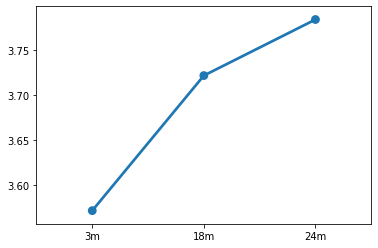

In [112]:
ent_mean_s= [ent_mean_s_3m]+[ent_mean_s_18m]+[ent_mean_s_24m]
sns.pointplot(x=['3m','18m','24m'],y=ent_mean_s)

In [110]:
age3m_cut=pd.cut(age3m_ns_mean, bins=2**np.linspace(0, 15, 500)).sort_index()
counts3m=age3m_cut.value_counts()
cnt3m=counts3m/len(counts3m)
ent_mean_ns_3m=entropy(cnt3m)
print(ent_mean_ns_3m)

age18m_cut=pd.cut(age18m_ns_mean, bins=2**np.linspace(0, 15, 500)).sort_index()
counts18m=age18m_cut.value_counts()
cnt18m=counts18m/len(counts18m)
ent_mean_ns_18m=entropy(cnt18m)
print(ent_mean_ns_18m)

age24m_cut=pd.cut(age24m_ns_mean, bins=2**np.linspace(0, 15, 500)).sort_index()
counts24m=age24m_cut.value_counts()
cnt24m=counts24m/len(counts24m)
ent_mean_ns_24m=entropy(cnt24m)
print(ent_mean_ns_24m)

3.4860558710950404
3.486758470009086
3.65530652566562


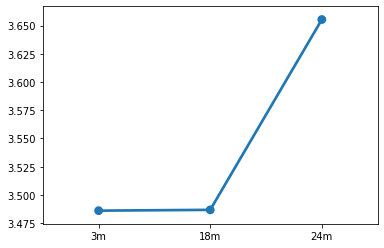

In [113]:
ent_mean_ns= [ent_mean_ns_3m]+[ent_mean_ns_18m]+[ent_mean_ns_24m]
sns.pointplot(x=['3m','18m','24m'],y=ent_mean_ns)